In [1]:
import pandas as pd
import numpy as np
from IPython.display import display
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import scipy.stats as stats
import seaborn as sns
import random
import os

from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt

import warnings
warnings.filterwarnings('ignore')

sns.set_style()

# path to data folder
# PATH = r'C:\Users\Никита\Андан\Project\data'
PATH = r"/Users/andrewnizov/Desktop/АнДан/Проект"

# Stock analysis via visualization

**Important disclaimer:** in this notebook you will see a lot of small scatter plots! This is not our negligence. Those sizes of scatter plot allow us to see, is there smth similar to linear dependance or it's chaotic arrangement of points. **IF** the scatter plot even remotely suggests a linear dependance, which is beneficial for further model building, **we examine** this in greater detail and display this plot on a larger scale.

### **Notebook content:**
* **[Step №1.](#investigation_of_seasonality)** Investigation of Seasonality in the Analyzed Stocks
    * **[Step №1(a).](#visual_analysis_for_all_sectors)** **Visual analysis** through plots for all sectors involving specific stocks.
    
  For every sector in oder:
    * **[Step №1(b).](#exponential_smoothing_for_fintech)** Application of **exponential smoothing** to ascertain which stocks potentially demonstrate seasonality.
    * **[Step №1(c).](#autocorrelation_plots_and_seasonal_decomposition_analysis)** **Autocorrelation plots and seasonal decomposition analysis** for those shares that potentially demonstrate seasonality.
* **[Step №2.](#imoex_s&p500_stocks)** Investigation of the dependency between **IMOEX and S&P500 indices and the prices of stocks** across all sectors.
* **[Step №3.](#matrix_indices_stocks)** Correlation matrix between **the indices and the prices of the studied stocks** across all sectors.
* **[Step №4.](#scatter_plots_usdrub_stocks)** Scatter diagrams for **USDRUB and the prices of the studied stocks** for all sectors, complemented by a comprehensive correlation matrix for **the rates of precious metals and USDRUB**.
* **[Step №5.](#metal_prices_stocks)** Analysis of Dependencies Between **Precious Metal Prices and Stock Prices.**
* **[Hypothesis №1](#hypothesis1)**: distribution of returns
* **[Hypothesis №2](#hypothesis2)**: [stylized fact](http://www.cs.ucl.ac.uk/fileadmin/UCL-CS/images/Research_Student_Information/RN_11_01.pdf) about January
* **[Hypothesis №3](#hypothesis3)**: stylized fact about the days of the week

In [2]:
# we needed this code to teamwork. different participants run this code in different ways
"""fintech = pd.read_csv(os.path.join(PATH, r'final_datasets/final_fintech.csv'))
fintech['date'] = pd.to_datetime(fintech['date'])
ticker_names = os.listdir(os.path.join(PATH, r'fintech'))"""

"fintech = pd.read_csv(os.path.join(PATH, r'final_datasets/final_fintech.csv'))\nfintech['date'] = pd.to_datetime(fintech['date'])\nticker_names = os.listdir(os.path.join(PATH, r'fintech'))"

In [3]:
fintech = pd.read_csv('final_fintech.csv')
industrial_goods = pd.read_csv('final_industrial_goods.csv')
renewable_energy = pd.read_csv('final_renewable_energy.csv')
healthcare_services = pd.read_csv('final_healthcare_services.csv')

fintech['date'] = pd.to_datetime(fintech['date'])
industrial_goods['date'] = pd.to_datetime(industrial_goods['date'])
renewable_energy['date'] = pd.to_datetime(renewable_energy['date'])
healthcare_services['date'] = pd.to_datetime(healthcare_services['date'])

In [4]:
fintech_companies = [ticker for ticker in fintech.columns if (ticker[:5] == 'close')]
industrial_goods_companies = [ticker for ticker in industrial_goods.columns if (ticker[:5] == 'close')]
renewable_energy_companies = [ticker for ticker in renewable_energy.columns if (ticker[:5] == 'close')]
healthcare_services_companies = [ticker for ticker in healthcare_services.columns if (ticker[:5] == 'close')]

In [5]:
print(f'Total amount of the studied stocks: {len(fintech_companies) + len(industrial_goods_companies) + len(renewable_energy_companies) + len(healthcare_services_companies)}')

Total amount of the studied stocks: 360


<a id="investigation_of_seasonality"></a>
# Step №1. Investigation of Seasonality

Seasonality is significant thing to check. In case of revealing it, we will be able **to create new features, to make our ML-model more accurate, to understand which model is better to use** and so on. These reasons justify, why we have so much methods to check the seasonality.

<a id='visual_analysis_for_all_sectors'></a>
## Step №1(a). Visual analysis for all sectors

## Fintech
Here we want to try to evaluate fintech sector in general.

In [6]:
ru_ticker_names_close_fintech = [ticker for ticker in fintech.columns if (ticker[-2:] == 'RU') and (ticker[:5] == 'close')]
ru_ticker_names_volume_fintech = [ticker for ticker in fintech.columns if (ticker[-2:] == 'RU') and (ticker[:6] == 'volume')]
usa_ticker_names_close_fintech = [ticker for ticker in fintech.columns if (ticker[-3:] == 'USA') and (ticker[:5] == 'close')]
usa_ticker_names_volume_fintech = [ticker for ticker in fintech.columns if (ticker[-3:] == 'USA') and (ticker[:6] == 'volume')]

In [7]:
# We aggregate data on the financial indicators of companies with 
# a time interval of one month, and then extract data 
# on closing prices and trading volumes for Russian and American companies.
fintech_monthly = fintech.resample('M', on='date').mean(numeric_only=True)

ru_fintech_monthly_close = fintech_monthly[ru_ticker_names_close_fintech]
ru_fintech_monthly_volume = fintech_monthly[ru_ticker_names_volume_fintech]
usa_fintech_monthly_close = fintech_monthly[usa_ticker_names_close_fintech]
usa_fintech_monthly_volume = fintech_monthly[usa_ticker_names_volume_fintech]

For illustration purposes, we will display graphs for 5 randomly selected stocks of Russian and American companies in the fintech sector.

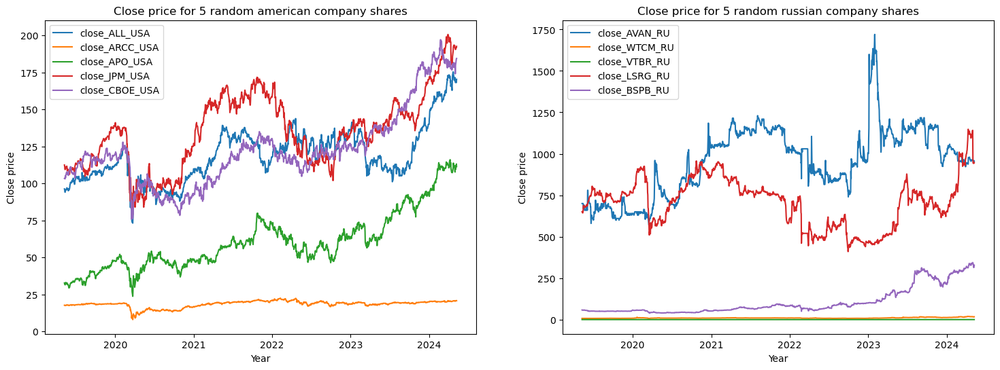

In [8]:
# PRICE DEFAULT
random.seed(2)
USA_price_samples_fintech = random.sample(usa_ticker_names_close_fintech, 5)
random.seed(2)
RU_price_samples_fintech = random.sample(ru_ticker_names_close_fintech, 5)

fig, axes = plt.subplots(1, 2, figsize=(18, 6))
for USA_share_price in USA_price_samples_fintech:
    sns.lineplot(fintech, x = 'date', y = USA_share_price, label = USA_share_price, ax=axes[0])
axes[0].set_xlabel('Year')
axes[0].set_ylabel('Close price')
axes[0].set_title('Close price for 5 random american company shares')
axes[0].legend();
    
for RU_share_price in RU_price_samples_fintech:
    sns.lineplot(fintech, x = 'date', y = RU_share_price, label = RU_share_price, ax=axes[1])
axes[1].set_xlabel('Year')
axes[1].set_ylabel('Close price')
axes[1].set_title('Close price for 5 random russian company shares')
axes[1].legend();

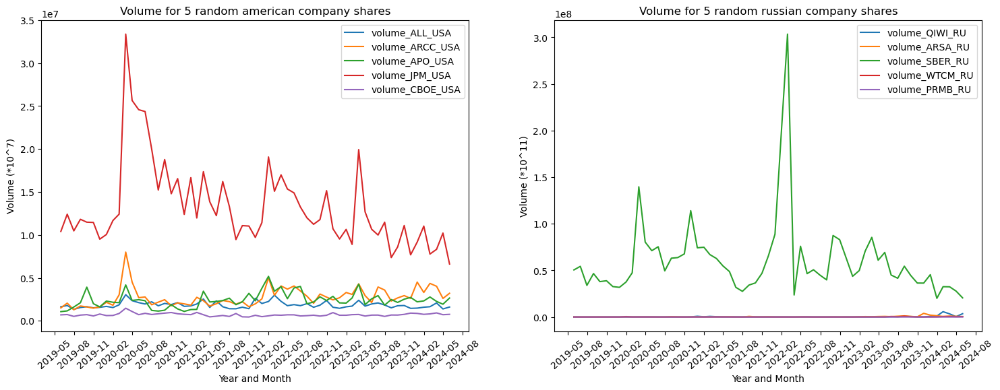

In [9]:
# VOLUME MONTHLY
random.seed(2)
USA_monthly_volume_samples_fintech = random.sample(list(usa_fintech_monthly_volume.columns), 5)
random.seed(52)
RU_monthly_volume_samples_fintech = random.sample(list(ru_fintech_monthly_volume.columns), 5)

fig, axes = plt.subplots(1, 2, figsize=(18, 6))
for USA_share_monthly_volume in USA_monthly_volume_samples_fintech:
    sns.lineplot(fintech_monthly, x = fintech_monthly.index, y = USA_share_monthly_volume, label = USA_share_monthly_volume, ax=axes[0])
# We will utilize mdates from Matplotlib to correctly label the values on the x-axis.
axes[0].xaxis.set_major_locator(mdates.MonthLocator(interval=3))
axes[0].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
axes[0].set_xlabel('Year and Month')
axes[0].set_ylabel('Volume (*10^7)')
axes[0].set_title('Volume for 5 random american company shares')
axes[0].tick_params(axis='x', rotation=40)
axes[0].legend();

for RU_share_monthly_volume in RU_monthly_volume_samples_fintech:
    sns.lineplot(fintech_monthly, x = fintech_monthly.index, y = RU_share_monthly_volume, label = RU_share_monthly_volume, ax=axes[1])
axes[1].xaxis.set_major_locator(mdates.MonthLocator(interval=3))
axes[1].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
axes[1].set_xlabel('Year and Month')
axes[1].set_ylabel('Volume (*10^11)')
axes[1].set_title('Volume for 5 random russian company shares')
axes[1].tick_params(axis='x', rotation=40)
axes[1].legend();

**Conclusion:** It can be observed that predominantly from February (%m=02) to May (%m=05), prices tend to decrease while trading volumes increase. However, based on the data from the graphs, it is difficult to confidently assert this trend and identify any additional seasonality. **Therefore, it is necessary to employ a more advanced model for time series analysis.**

**Disclaimer:** The same analysis will be conducted for three additional sectors. Since the interim conclusions are similar to the above, we will provide **a single comprehensive conclusion at the end.**

## Renewable energy

re = renewable energy

In [10]:
ru_ticker_names_close_re = [ticker for ticker in renewable_energy.columns if (ticker[-2:] == 'RU') and (ticker[:5] == 'close')]
ru_ticker_names_volume_re = [ticker for ticker in renewable_energy.columns if (ticker[-2:] == 'RU') and (ticker[:6] == 'volume')]
usa_ticker_names_close_re = [ticker for ticker in renewable_energy.columns if (ticker[-3:] == 'USA') and (ticker[:5] == 'close')]
usa_ticker_names_volume_re = [ticker for ticker in renewable_energy.columns if (ticker[-3:] == 'USA') and (ticker[:6] == 'volume')]

In [11]:
re_monthly = renewable_energy.resample('M', on='date').mean(numeric_only=True)

ru_re_monthly_close = re_monthly[ru_ticker_names_close_re]
ru_re_monthly_volume = re_monthly[ru_ticker_names_volume_re]
usa_re_monthly_close = re_monthly[usa_ticker_names_close_re]
usa_re_monthly_volume = re_monthly[usa_ticker_names_volume_re]

For illustration purposes, we will display graphs for 5 randomly selected stocks of Russian and American companies in the renewable energy sector.

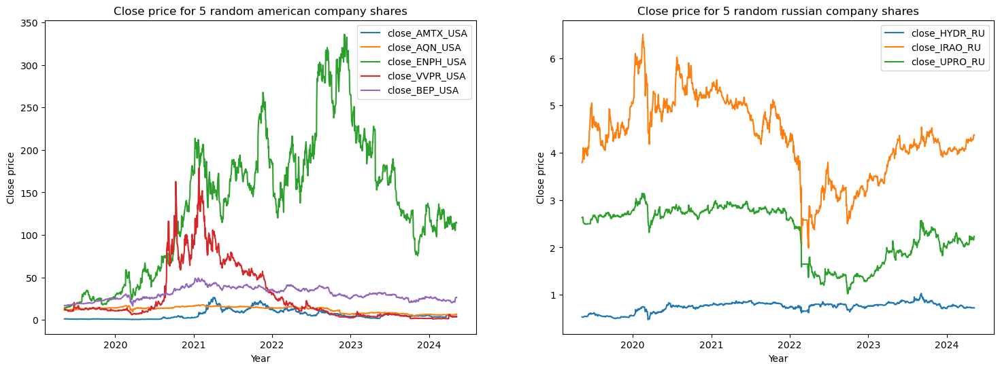

In [12]:
# PRICE DEFAULT
random.seed(2)
USA_price_samples_re = random.sample(usa_ticker_names_close_re, 5)

fig, axes = plt.subplots(1, 2, figsize=(18, 6))
for USA_share_price in USA_price_samples_re:
    sns.lineplot(renewable_energy, x = 'date', y = USA_share_price, label = USA_share_price, ax=axes[0])
axes[0].set_xlabel('Year')
axes[0].set_ylabel('Close price')
axes[0].set_title('Close price for 5 random american company shares')
axes[0].legend();
    
for RU_share_price in ru_ticker_names_close_re:
    sns.lineplot(renewable_energy, x = 'date', y = RU_share_price, label = RU_share_price, ax=axes[1])
axes[1].set_xlabel('Year')
axes[1].set_ylabel('Close price')
axes[1].set_title('Close price for 5 random russian company shares')
axes[1].legend();

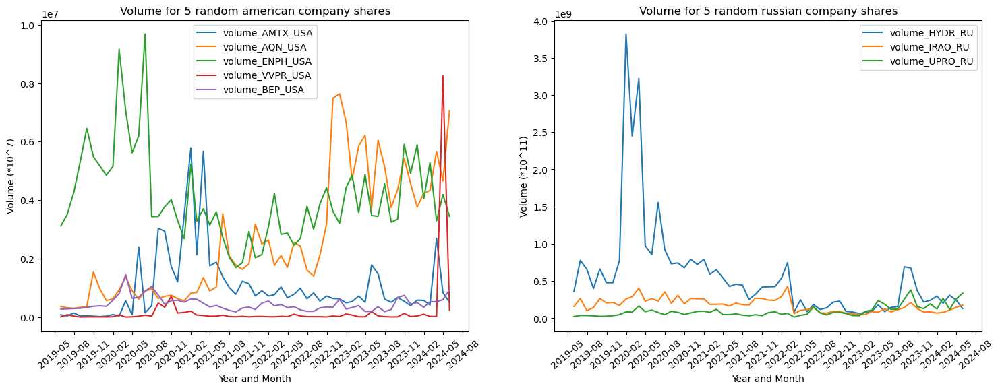

In [13]:
# VOLUME MONTHLY
random.seed(2)
USA_monthly_volume_samples_re = random.sample(usa_ticker_names_volume_re, 5)

fig, axes = plt.subplots(1, 2, figsize=(18, 6))
for USA_share_monthly_volume in USA_monthly_volume_samples_re:
    sns.lineplot(re_monthly, x = re_monthly.index, y = USA_share_monthly_volume, label = USA_share_monthly_volume, ax=axes[0])
# We will utilize mdates from Matplotlib to correctly label the values on the x-axis.
axes[0].xaxis.set_major_locator(mdates.MonthLocator(interval=3))
axes[0].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
axes[0].set_xlabel('Year and Month')
axes[0].set_ylabel('Volume (*10^7)')
axes[0].set_title('Volume for 5 random american company shares')
axes[0].tick_params(axis='x', rotation=40)
axes[0].legend();

for RU_share_monthly_volume in ru_ticker_names_volume_re:
    sns.lineplot(re_monthly, x = re_monthly.index, y = RU_share_monthly_volume, label = RU_share_monthly_volume, ax=axes[1])
axes[1].xaxis.set_major_locator(mdates.MonthLocator(interval=3))
axes[1].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
axes[1].set_xlabel('Year and Month')
axes[1].set_ylabel('Volume (*10^11)')
axes[1].set_title('Volume for 5 random russian company shares')
axes[1].tick_params(axis='x', rotation=40)
axes[1].legend();

## Industrial goods

ig = industrial_goods

In [14]:
ru_ticker_names_close_ig = [ticker for ticker in industrial_goods.columns if (ticker[-2:] == 'RU') and (ticker[:5] == 'close')]
ru_ticker_names_volume_ig = [ticker for ticker in industrial_goods.columns if (ticker[-2:] == 'RU') and (ticker[:6] == 'volume')]
usa_ticker_names_close_ig = [ticker for ticker in industrial_goods.columns if (ticker[-3:] == 'USA') and (ticker[:5] == 'close')]
usa_ticker_names_volume_ig = [ticker for ticker in industrial_goods.columns if (ticker[-3:] == 'USA') and (ticker[:6] == 'volume')]

In [15]:
ig_monthly = industrial_goods.resample('M', on='date').mean(numeric_only=True)

ru_ig_monthly_close = ig_monthly[ru_ticker_names_close_ig]
ru_ig_monthly_volume = ig_monthly[ru_ticker_names_volume_ig]
usa_ig_monthly_close = ig_monthly[usa_ticker_names_close_ig]
usa_ig_monthly_volume = ig_monthly[usa_ticker_names_volume_ig]

For illustration purposes, we will display graphs for 5 randomly selected stocks of Russian and American companies in the renewable energy sector.

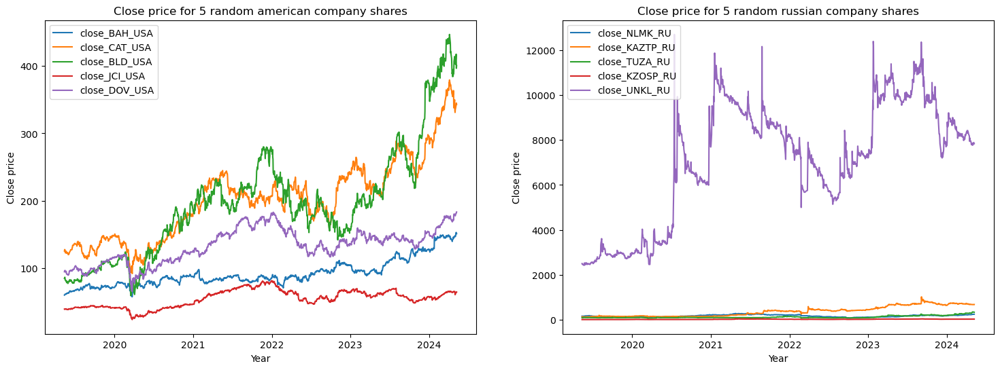

In [16]:
# PRICE DEFAULT
random.seed(2)
USA_price_samples_ig = random.sample(usa_ticker_names_close_ig, 5)
random.seed(5)
RU_price_samples_ig = random.sample(ru_ticker_names_close_ig, 5)

fig, axes = plt.subplots(1, 2, figsize=(18, 6))
for USA_share_price in USA_price_samples_ig:
    sns.lineplot(industrial_goods, x = 'date', y = USA_share_price, label = USA_share_price, ax=axes[0])
axes[0].set_xlabel('Year')
axes[0].set_ylabel('Close price')
axes[0].set_title('Close price for 5 random american company shares')
axes[0].legend();
    
for RU_share_price in RU_price_samples_ig:
    sns.lineplot(industrial_goods, x = 'date', y = RU_share_price, label = RU_share_price, ax=axes[1])
axes[1].set_xlabel('Year')
axes[1].set_ylabel('Close price')
axes[1].set_title('Close price for 5 random russian company shares')
axes[1].legend();

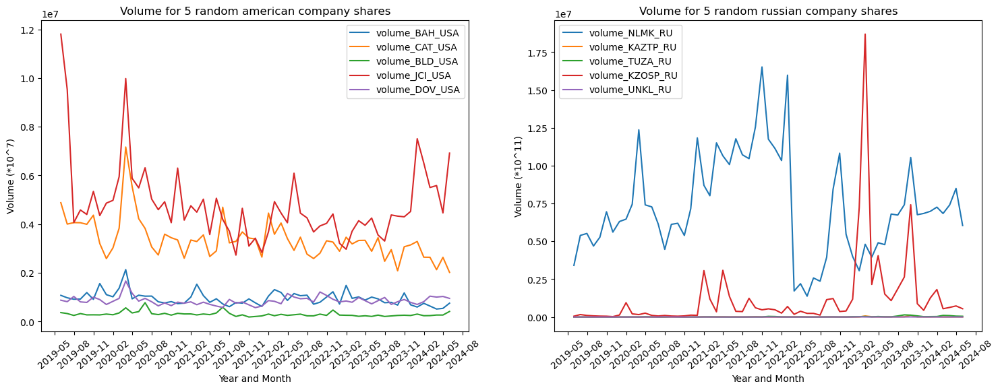

In [17]:
# VOLUME MONTHLY
random.seed(2)
USA_monthly_volume_samples_ig = random.sample(list(usa_ig_monthly_volume.columns), 5)
random.seed(5)
RU_monthly_volume_samples_ig = random.sample(list(ru_ig_monthly_volume.columns), 5)

fig, axes = plt.subplots(1, 2, figsize=(18, 6))
for USA_share_monthly_volume in USA_monthly_volume_samples_ig:
    sns.lineplot(ig_monthly, x = ig_monthly.index, y = USA_share_monthly_volume, label = USA_share_monthly_volume, ax=axes[0])
# We will utilize mdates from Matplotlib to correctly label the values on the x-axis.
axes[0].xaxis.set_major_locator(mdates.MonthLocator(interval=3))
axes[0].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
axes[0].set_xlabel('Year and Month')
axes[0].set_ylabel('Volume (*10^7)')
axes[0].set_title('Volume for 5 random american company shares')
axes[0].tick_params(axis='x', rotation=40)
axes[0].legend();

for RU_share_monthly_volume in RU_monthly_volume_samples_ig:
    sns.lineplot(ig_monthly, x = ig_monthly.index, y = RU_share_monthly_volume, label = RU_share_monthly_volume, ax=axes[1])
axes[1].xaxis.set_major_locator(mdates.MonthLocator(interval=3))
axes[1].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
axes[1].set_xlabel('Year and Month')
axes[1].set_ylabel('Volume (*10^11)')
axes[1].set_title('Volume for 5 random russian company shares')
axes[1].tick_params(axis='x', rotation=40)
axes[1].legend();

## Healthcare services

hs = healthcare services

In [18]:
ru_ticker_names_close_hs = [ticker for ticker in healthcare_services.columns if (ticker[-2:] == 'RU') and (ticker[:5] == 'close')]
ru_ticker_names_volume_hs = [ticker for ticker in healthcare_services.columns if (ticker[-2:] == 'RU') and (ticker[:6] == 'volume')]
usa_ticker_names_close_hs = [ticker for ticker in healthcare_services.columns if (ticker[-3:] == 'USA') and (ticker[:5] == 'close')]
usa_ticker_names_volume_hs = [ticker for ticker in healthcare_services.columns if (ticker[-3:] == 'USA') and (ticker[:6] == 'volume')]

In [19]:
hs_monthly = healthcare_services.resample('M', on='date').mean(numeric_only=True)

ru_hs_monthly_close = hs_monthly[ru_ticker_names_close_hs]
ru_hs_monthly_volume = hs_monthly[ru_ticker_names_volume_hs]
usa_hs_monthly_close = hs_monthly[usa_ticker_names_close_hs]
usa_hs_monthly_volume = hs_monthly[usa_ticker_names_volume_hs]

For illustration purposes, we will display graphs for 5 randomly selected stocks of Russian and American companies in the renewable energy sector.

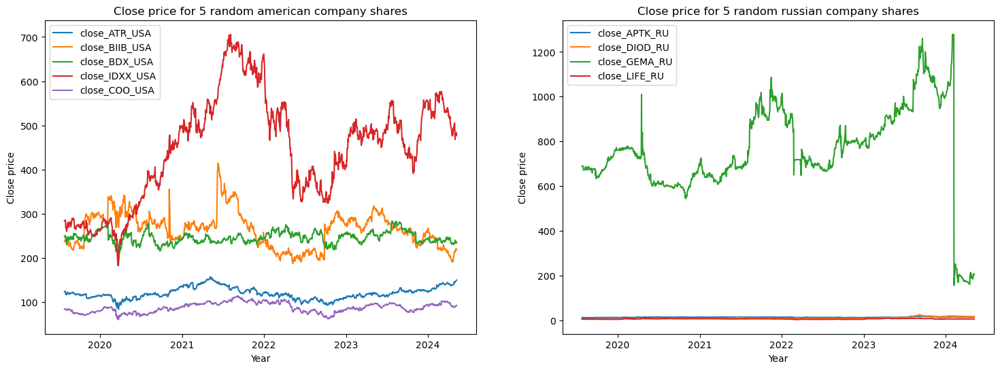

In [20]:
# PRICE DEFAULT
random.seed(2)
USA_price_samples_hs = random.sample(usa_ticker_names_close_hs, 5)

fig, axes = plt.subplots(1, 2, figsize=(18, 6))
for USA_share_price in USA_price_samples_hs:
    sns.lineplot(healthcare_services, x = 'date', y = USA_share_price, label = USA_share_price, ax=axes[0])
axes[0].set_xlabel('Year')
axes[0].set_ylabel('Close price')
axes[0].set_title('Close price for 5 random american company shares')
axes[0].legend();
    
for RU_share_price in ru_ticker_names_close_hs:
    sns.lineplot(healthcare_services, x = 'date', y = RU_share_price, label = RU_share_price, ax=axes[1])
axes[1].set_xlabel('Year')
axes[1].set_ylabel('Close price')
axes[1].set_title('Close price for 5 random russian company shares')
axes[1].legend();

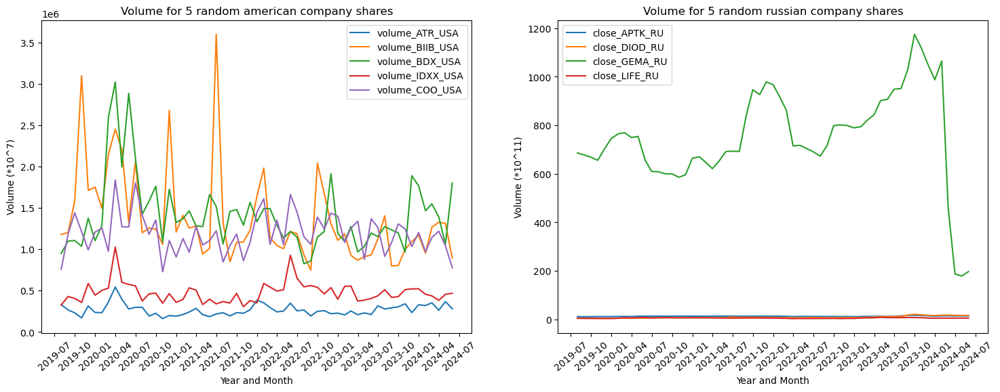

In [21]:
# VOLUME MONTHLY
random.seed(2)
USA_monthly_volume_samples_hs = random.sample(list(usa_hs_monthly_volume.columns), 5)

fig, axes = plt.subplots(1, 2, figsize=(18, 6))
for USA_share_monthly_volume in USA_monthly_volume_samples_hs:
    sns.lineplot(hs_monthly, x = hs_monthly.index, y = USA_share_monthly_volume, label = USA_share_monthly_volume, ax=axes[0])
# We will utilize mdates from Matplotlib to correctly label the values on the x-axis.
axes[0].xaxis.set_major_locator(mdates.MonthLocator(interval=3))
axes[0].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
axes[0].set_xlabel('Year and Month')
axes[0].set_ylabel('Volume (*10^7)')
axes[0].set_title('Volume for 5 random american company shares')
axes[0].tick_params(axis='x', rotation=40)
axes[0].legend();

for RU_share_monthly_volume in ru_ticker_names_close_hs:
    sns.lineplot(hs_monthly, x = hs_monthly.index, y = RU_share_monthly_volume, label = RU_share_monthly_volume, ax=axes[1])
axes[1].xaxis.set_major_locator(mdates.MonthLocator(interval=3))
axes[1].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
axes[1].set_xlabel('Year and Month')
axes[1].set_ylabel('Volume (*10^11)')
axes[1].set_title('Volume for 5 random russian company shares')
axes[1].tick_params(axis='x', rotation=40)
axes[1].legend();

**General conclusion:** In each sector, even for five random stocks, there are no consistent patterns either in price behavior or trading volumes. This justifies why we abandoned any aggregated analysis and conducted detailed, stock-specific examinations.

<a id='exponential_smoothing_for_fintech'></a>
## Step №1(b). Exponential smoothing for fintech
**Description:** AIC and BIC show, which model works better (model is better if indicators are lower). We decided to implement them to exponential smoothing, comparing two models: with and without siasonality for every **share**.

In [22]:
fintech_exp_smoothing = ru_ticker_names_close_fintech + usa_ticker_names_close_fintech

In [23]:
# general comment for all sectors: seasonal_periods=4 was chosen because it has lower 
# exp_smoothing_1.aic and .bic values compared to seasonal_periods=12.
fintech_seasonality_score = 0
for col in fintech[fintech_exp_smoothing]:
    fintech_exp_smoothing_with_seasonality = ExponentialSmoothing(
        fintech[col],
        seasonal_periods=4,
        trend="mul",
        seasonal="add",
        use_boxcox=True,
        initialization_method="estimated").fit()
    fitted_values_with_seasonality = fintech_exp_smoothing_with_seasonality.fittedvalues
    
    fintech_exp_smoothing_without_seasonality = ExponentialSmoothing(
        fintech[col], 
        trend="mul", 
        seasonal=None,
        use_boxcox=True, 
        initialization_method="estimated").fit()
    fitted_values_without_seasonality = fintech_exp_smoothing_without_seasonality.fittedvalues
    
    if (fintech_exp_smoothing_with_seasonality.aic + fintech_exp_smoothing_with_seasonality.bic) < (fintech_exp_smoothing_without_seasonality.aic + fintech_exp_smoothing_without_seasonality.bic):
        fintech_seasonality_score += 1
        print(f'Stocks likely exhibiting seasonality: {col}')
        
print(fintech_seasonality_score / len(fintech_exp_smoothing))

Stocks likely exhibiting seasonality: close_RGSS_RU
Stocks likely exhibiting seasonality: close_VTBR_RU
0.01904761904761905


**Conclusion:** Only two stocks potentially exhibit seasonality. *We will examine these cases **in more detail***, as we used a relatively lenient threshold.

<a id='autocorrelation_plots_and_seasonal_decomposition_analysis'></a>
## Step №1(c). Autocorrelation plots and seasonal decomposition analysis

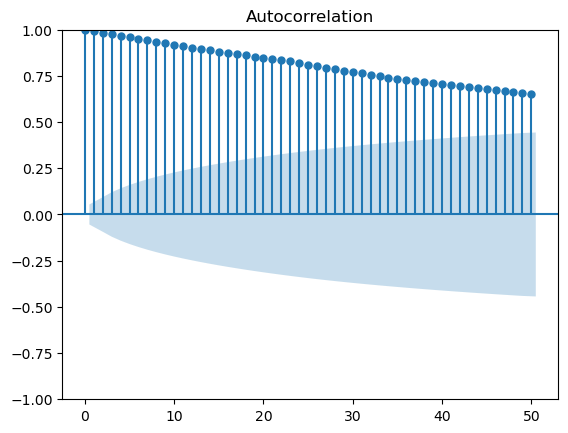

In [24]:
plot_acf(fintech['close_RGSS_RU'], lags=50)
plt.show()

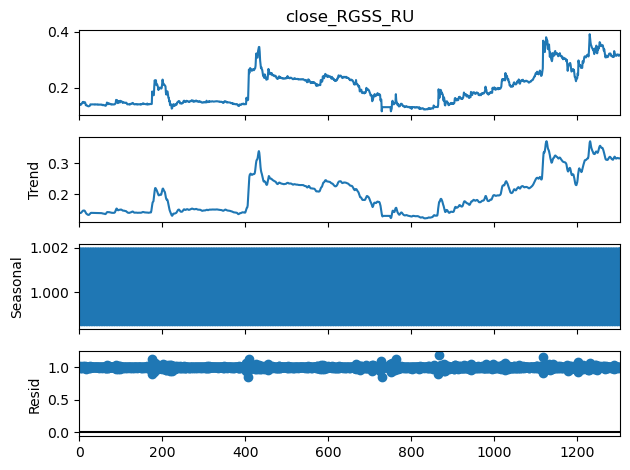

In [25]:
result = seasonal_decompose(fintech['close_RGSS_RU'], model='multiplicative', period=4)
result.plot()
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

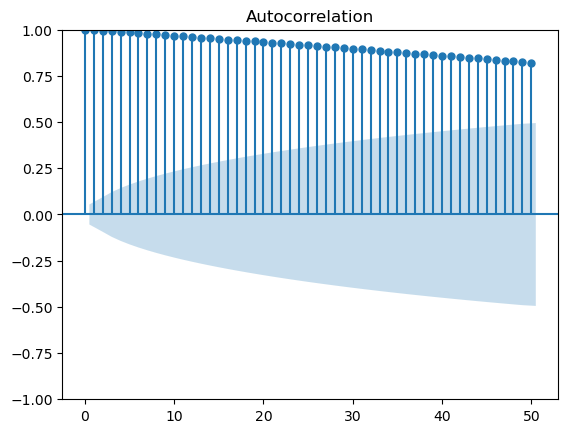

In [26]:
plot_acf(fintech['close_VTBR_RU'], lags=50)
plt.show

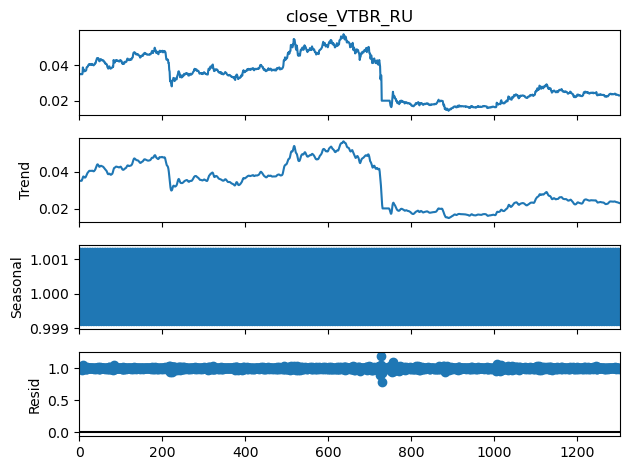

In [27]:
result = seasonal_decompose(fintech['close_VTBR_RU'], model='multiplicative', period=4)
result.plot()
plt.show()

**General conclusions for 2 shares:** 
* According to [this resource](http://www.machinelearning.ru/wiki/index.php?title=%D0%9A%D0%BE%D1%80%D1%80%D0%B5%D0%BB%D0%BE%D0%B3%D1%80%D0%B0%D0%BC%D0%BC%D0%B0), the autocorrelation plot suggests statistically significant autocorrelation of prices, which means models **that take into account previous values can be effectively used.** (If the autocorrelation is above the blue background, it is statistically significant.)

* The `seasonal_decompose` graph identified noise instead of seasonality and simply smoothed the series with a trend. The model failed to capture seasonality, but **the result (that noise can be smoothed in this way) is interesting in itself and will be used in further analysis**.

**Disclaimer:** Previous conclusion is the same for following sectors!

## Step №1(b). Exponential smoothing for renewable energy

In [28]:
re_exp_smoothing = ru_ticker_names_close_re + usa_ticker_names_close_re

In [29]:
re_seasonality_score = 0
for col in renewable_energy[re_exp_smoothing]:
    re_exp_smoothing_with_seasonality = ExponentialSmoothing(
        renewable_energy[col],
        seasonal_periods=4,
        trend="mul",
        seasonal="add",
        use_boxcox=True,
        initialization_method="estimated").fit()
    fitted_values_with_seasonality = re_exp_smoothing_with_seasonality.fittedvalues
    
    re_exp_smoothing_without_seasonality = ExponentialSmoothing(
        renewable_energy[col], 
        trend="mul", 
        seasonal=None,
        use_boxcox=True, 
        initialization_method="estimated").fit()
    fitted_values_without_seasonality = re_exp_smoothing_without_seasonality.fittedvalues
    
    if (re_exp_smoothing_with_seasonality.aic + re_exp_smoothing_with_seasonality.bic) < (re_exp_smoothing_without_seasonality.aic + re_exp_smoothing_without_seasonality.bic):
        re_seasonality_score += 1
        print(f'Stocks likely exhibiting seasonality: {col}')
        
print(re_seasonality_score / len(re_exp_smoothing))

Stocks likely exhibiting seasonality: close_HYDR_RU
0.03333333333333333


## Step №1(c). Autocorrelation plots and seasonal decomposition analysis

<function matplotlib.pyplot.show(close=None, block=None)>

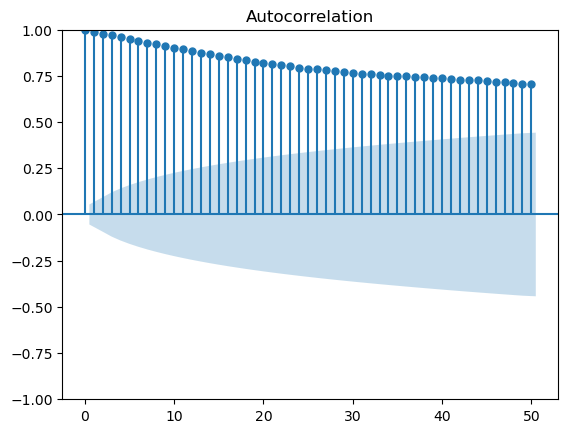

In [30]:
plot_acf(renewable_energy['close_HYDR_RU'], lags=50)
plt.show

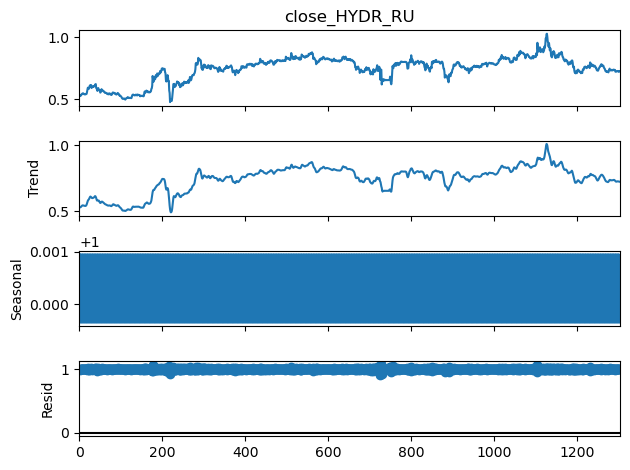

In [31]:
result = seasonal_decompose(renewable_energy['close_HYDR_RU'], model='multiplicative', period=4)
result.plot()
plt.show()

## Step №1(b). Exponential smoothing for industrial goods

In [32]:
ig_exp_smoothing = ru_ticker_names_close_ig + usa_ticker_names_close_ig

In [33]:
for col in industrial_goods[ig_exp_smoothing]:
    if industrial_goods[col].all() <=0:
        print(col)

close_NKSH_RU


## Step №1(b). Exponential smoothing for healthcare services
hs = healthcare services

In [34]:
hs_exp_smoothing = ru_ticker_names_close_hs + usa_ticker_names_close_hs

In [35]:
for col in healthcare_services[hs_exp_smoothing]:
    if healthcare_services[col].all() <=0:
        print(col)

In [36]:
hs_seasonality_score = 0
for col in healthcare_services[hs_exp_smoothing]:
    hs_exp_smoothing_with_seasonality = ExponentialSmoothing(
        healthcare_services[col],
        seasonal_periods=4,
        trend="add",
        seasonal="add",
        use_boxcox=True,
        initialization_method="estimated").fit()
    fitted_values_with_seasonality = hs_exp_smoothing_with_seasonality.fittedvalues
    
    hs_exp_smoothing_without_seasonality = ExponentialSmoothing(
        healthcare_services[col], 
        trend="add", 
        seasonal=None,
        use_boxcox=True, 
        initialization_method="estimated").fit()
    fitted_values_without_seasonality = hs_exp_smoothing_without_seasonality.fittedvalues
    
    if (hs_exp_smoothing_with_seasonality.aic + hs_exp_smoothing_with_seasonality.bic) < (hs_exp_smoothing_without_seasonality.aic + hs_exp_smoothing_without_seasonality.bic):
        hs_seasonality_score += 1
        print(col)
        
print(hs_seasonality_score / len(hs_exp_smoothing))

0.0


<a id='imoex_s&p500_stocks'></a>
# Step №2. Investigation of the dependency between IMOEX and S&P500 indices and the prices of stocks.
This step is dedicated to check is there any correlation between IMOEX and S&P500 indices and the prices of stocks. All these steps is also important no to skip, beacuse weak dependency between features and stock prices, that we want to forecast is also valuable information. With it we can create more accurate model.

## Fintech

* ### Russian companies

To be more precise in future forecast, we decided to take **lagged features** (in all scatter plots) and normal share price data.

In [37]:
lagged_columns_fintech_ru = fintech[ru_ticker_names_close_fintech].shift(10)
lagged_columns_fintech_ru = lagged_columns_fintech_ru.add_suffix('_lag10')

In [38]:
fintech_df_with_lagged_data_ru = pd.concat([lagged_columns_fintech_ru, fintech[['Close_IMOEX', 'gap_co_IMOEX', 
                                                'gap_hl_IMOEX', 'Volume_IMOEX', 'close_S&P500', 
                                                'gap_hl_S&P500', 'gap_co_S&P500', 'volume_S&P500']]], axis=1)

To start, we need to assess the overall picture. We will display `PairGrid` to avoid iterating through all possible combinations and to determine if any pair of metrics warrants more thorough investigation.

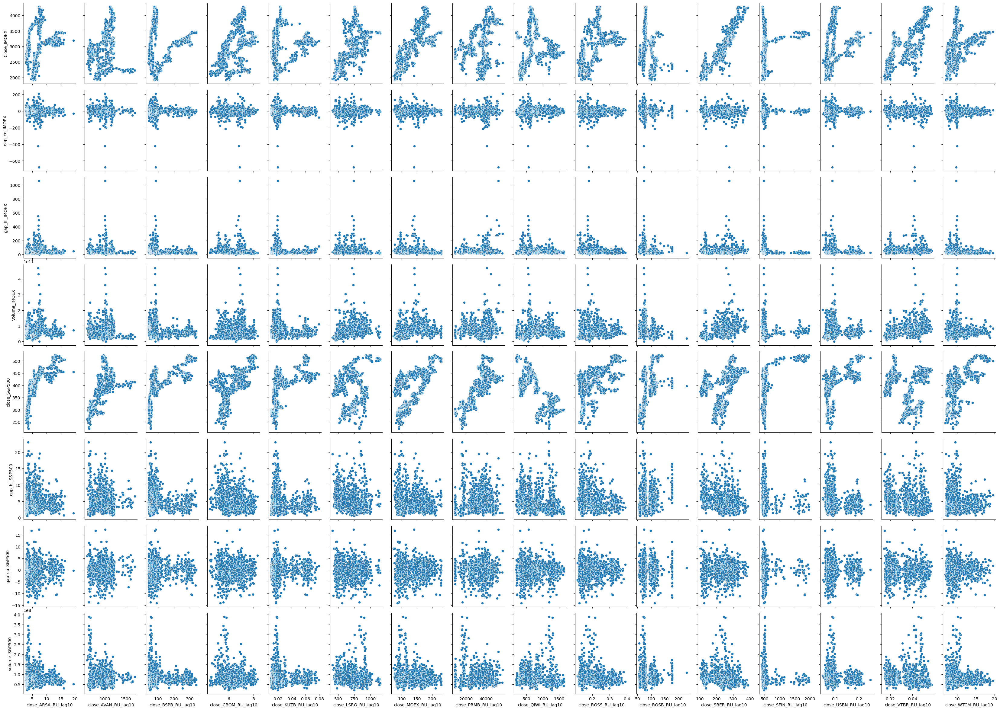

In [39]:
scatters = sns.PairGrid(fintech_df_with_lagged_data_ru, y_vars=['Close_IMOEX', 'gap_co_IMOEX', 
                                                             'gap_hl_IMOEX', 'Volume_IMOEX', 'close_S&P500', 
                                                             'gap_hl_S&P500', 'gap_co_S&P500', 'volume_S&P500'], 
                        x_vars=lagged_columns_fintech_ru.columns, height=3, aspect=0.7)
scatters.map(sns.scatterplot)

plt.show()

**Conclusion:** Interestingly, the presence of a lag does not significantly alter the appearance of the scatter plots. It’s also worth noting that the only somewhat interpretable dependencies emerged between the stock prices of Russian companies and the Close_IMOEX and close_S&P500 indicators.

* ### American companies

Creating `PairGrid` for the remaining 89 American stocks proved too cluttered and time-consuming. Therefore, we decided that analyzing 20 random stocks would provide a sufficiently representative assessment of the fintech sector. We will first examine if there is anything of interest.

In [40]:
random.seed(5)
random_usa_ticker_names_fintech = random.sample(usa_ticker_names_close_fintech, 20)

lagged_columns_fintech_usa = fintech[random_usa_ticker_names_fintech].shift(10)
lagged_columns_fintech_usa = lagged_columns_fintech_usa.add_suffix('_lag10')

fintech_df_with_lagged_data_usa = pd.concat([lagged_columns_fintech_usa, fintech[['close_S&P500', 
                                                                              'gap_hl_S&P500', 'gap_co_S&P500', 
                                                                              'volume_S&P500']]], axis=1)

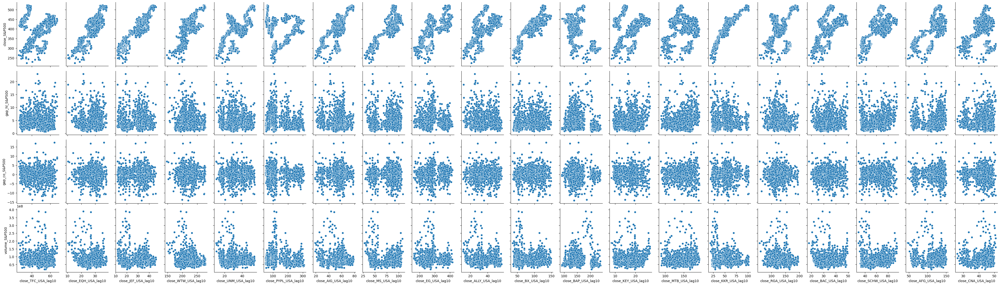

In [41]:
scatters = sns.PairGrid(fintech_df_with_lagged_data_usa, y_vars=['close_S&P500', 'gap_hl_S&P500', 
                                                             'gap_co_S&P500', 'volume_S&P500'],  
                        x_vars=lagged_columns_fintech_usa.columns, height=3, aspect=0.7)
scatters.map(sns.scatterplot)

plt.show()

**Conclusion:** The idea with gaps failed. However, we will eliminate features only after assessing feature importance. The only useful attribute appears to be `S&P500_close`, which merits closer attention and warrants the use of `regplot` for further analysis.

* ### Let's examine the `close_S&P500` attribute.

In [42]:
random.seed(21)
display(random.sample(random_usa_ticker_names_fintech, 3))
display(random.sample(ru_ticker_names_close_fintech, 3))

['close_PYPL_USA', 'close_MTB_USA', 'close_AFG_USA']

['close_RGSS_RU', 'close_PRMB_RU', 'close_USBN_RU']

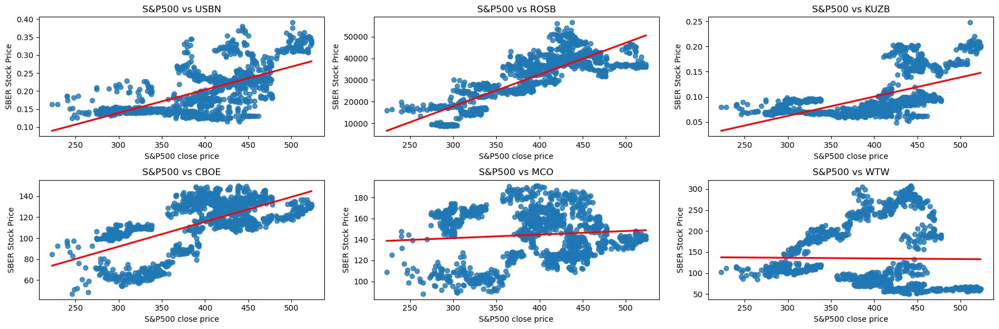

In [43]:
fig, axes = plt.subplots(2, 3, figsize=(18, 6))

sns.regplot(x='close_S&P500', y='close_RGSS_RU_lag10', data=fintech_df_with_lagged_data_ru, ax=axes[0, 0], ci=None, line_kws={'color': 'red'})
axes[0, 0].set_title('S&P500 vs USBN')
axes[0, 0].set_xlabel('S&P500 close price')
axes[0, 0].set_ylabel('SBER Stock Price')

sns.regplot(x='close_S&P500', y='close_PRMB_RU_lag10', data=fintech_df_with_lagged_data_ru, ax=axes[0, 1], ci=None, line_kws={'color': 'red'})
axes[0, 1].set_title('S&P500 vs ROSB')
axes[0, 1].set_xlabel('S&P500 close price')
axes[0, 1].set_ylabel('SBER Stock Price')

sns.regplot(x='close_S&P500', y='close_USBN_RU_lag10', data=fintech_df_with_lagged_data_ru, ax=axes[0, 2], ci=None, line_kws={'color': 'red'})
axes[0, 2].set_title('S&P500 vs KUZB')
axes[0, 2].set_xlabel('S&P500 close price')
axes[0, 2].set_ylabel('SBER Stock Price')

sns.regplot(x='close_S&P500', y='close_AFG_USA_lag10', data=fintech_df_with_lagged_data_usa, ax=axes[1, 0], ci=None, line_kws={'color': 'red'})
axes[1, 0].set_title('S&P500 vs CBOE')
axes[1, 0].set_xlabel('S&P500 close price')
axes[1, 0].set_ylabel('SBER Stock Price')

sns.regplot(x='close_S&P500', y='close_MTB_USA_lag10', data=fintech_df_with_lagged_data_usa, ax=axes[1, 1], ci=None, line_kws={'color': 'red'})
axes[1, 1].set_title('S&P500 vs MCO')
axes[1, 1].set_xlabel('S&P500 close price')
axes[1, 1].set_ylabel('SBER Stock Price')

sns.regplot(x='close_S&P500', y='close_PYPL_USA_lag10', data=fintech_df_with_lagged_data_usa, ax=axes[1, 2], ci=None, line_kws={'color': 'red'})
axes[1, 2].set_title('S&P500 vs WTW')
axes[1, 2].set_xlabel('S&P500 close price')
axes[1, 2].set_ylabel('SBER Stock Price')


plt.tight_layout()
plt.show()

* ### Let's examine the `Close_IMOEX` attribute.

In [44]:
random.seed(1)
random.sample(ru_ticker_names_close_fintech, 6)

['close_KUZB_RU',
 'close_RGSS_RU',
 'close_USBN_RU',
 'close_SFIN_RU',
 'close_AVAN_RU',
 'close_WTCM_RU']

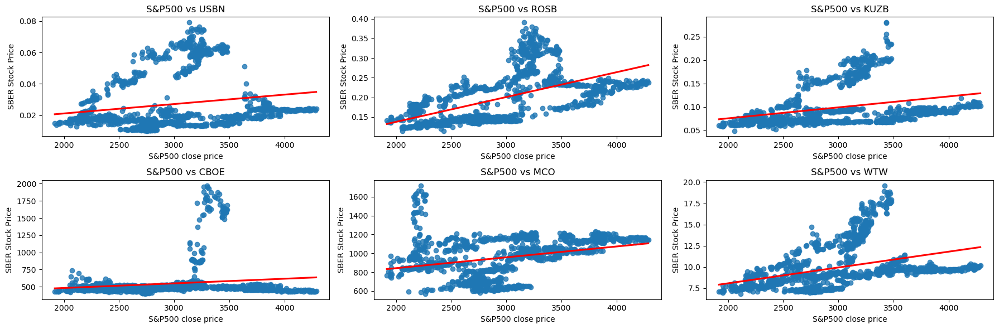

In [45]:
fig, axes = plt.subplots(2, 3, figsize=(18, 6))

sns.regplot(x='Close_IMOEX', y='close_KUZB_RU', data=fintech, ax=axes[0, 0], ci=None, line_kws={'color': 'red'})
axes[0, 0].set_title('S&P500 vs USBN')
axes[0, 0].set_xlabel('S&P500 close price')
axes[0, 0].set_ylabel('SBER Stock Price')

sns.regplot(x='Close_IMOEX', y='close_RGSS_RU', data=fintech, ax=axes[0, 1], ci=None, line_kws={'color': 'red'})
axes[0, 1].set_title('S&P500 vs ROSB')
axes[0, 1].set_xlabel('S&P500 close price')
axes[0, 1].set_ylabel('SBER Stock Price')

sns.regplot(x='Close_IMOEX', y='close_USBN_RU', data=fintech, ax=axes[0, 2], ci=None, line_kws={'color': 'red'})
axes[0, 2].set_title('S&P500 vs KUZB')
axes[0, 2].set_xlabel('S&P500 close price')
axes[0, 2].set_ylabel('SBER Stock Price')

sns.regplot(x='Close_IMOEX', y='close_SFIN_RU', data=fintech, ax=axes[1, 0], ci=None, line_kws={'color': 'red'})
axes[1, 0].set_title('S&P500 vs CBOE')
axes[1, 0].set_xlabel('S&P500 close price')
axes[1, 0].set_ylabel('SBER Stock Price')

sns.regplot(x='Close_IMOEX', y='close_AVAN_RU', data=fintech, ax=axes[1, 1], ci=None, line_kws={'color': 'red'})
axes[1, 1].set_title('S&P500 vs MCO')
axes[1, 1].set_xlabel('S&P500 close price')
axes[1, 1].set_ylabel('SBER Stock Price')

sns.regplot(x='Close_IMOEX', y='close_WTCM_RU', data=fintech, ax=axes[1, 2], ci=None, line_kws={'color': 'red'})
axes[1, 2].set_title('S&P500 vs WTW')
axes[1, 2].set_xlabel('S&P500 close price')
axes[1, 2].set_ylabel('SBER Stock Price')


plt.tight_layout()
plt.show()

<a id='matrix_indices_stocks'></a>
# **Step №3.** Correlation Matrix Between Indices and Stock Prices.

## Fintech

For 5 randomly selected stocks of American companies.

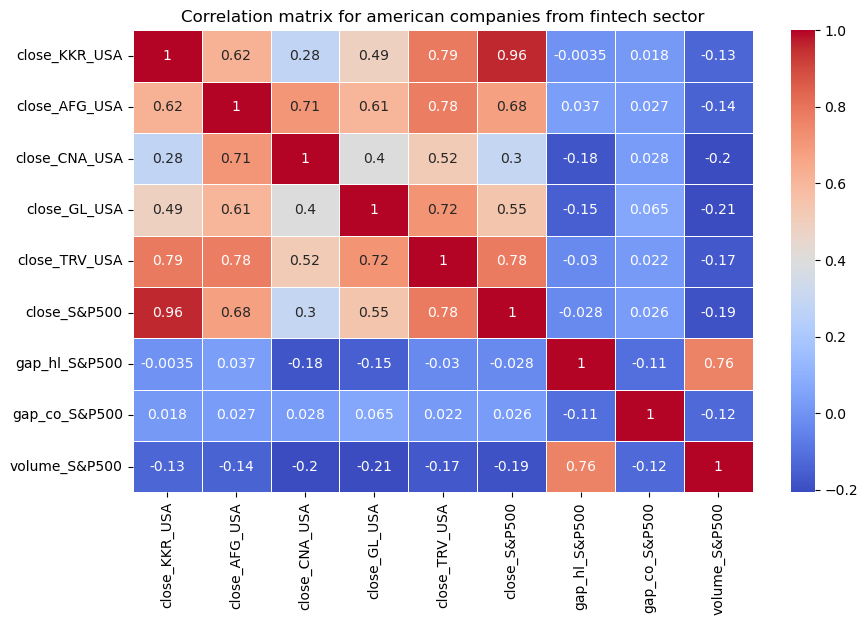

In [46]:
random.seed(25)
USA_price_samples_fintech = random.sample(usa_ticker_names_close_fintech, 5)
fintech_corr = fintech[USA_price_samples_fintech + 
                       ['close_S&P500', 'gap_hl_S&P500', 'gap_co_S&P500', 'volume_S&P500']].corr()
plt.figure(figsize=(10, 6))
plt.title('Correlation matrix for american companies from fintech sector')
sns.heatmap(fintech_corr, annot=True, cmap='coolwarm', linewidths=0.5);

For 5 randomly selected stocks of Russian companies.

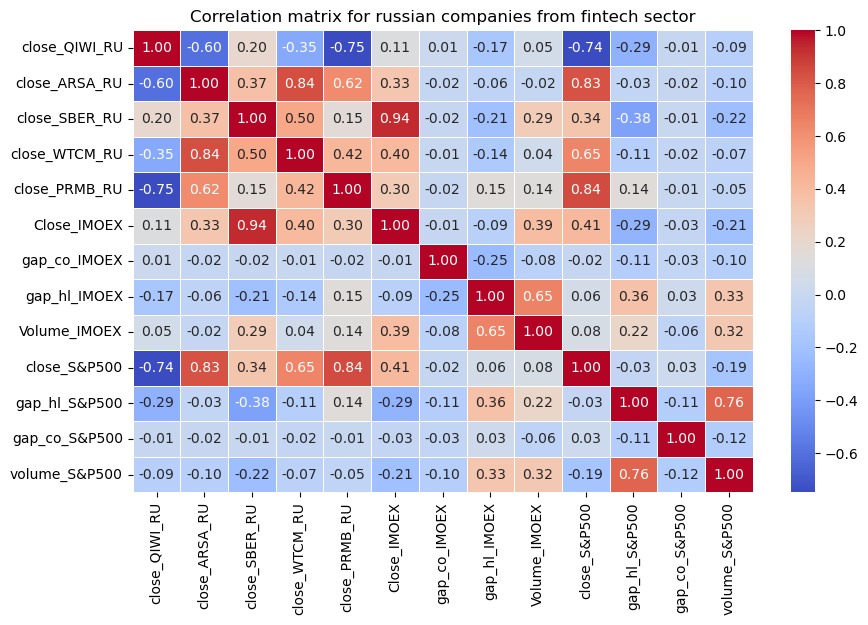

In [47]:
random.seed(52)
RU_price_samples_fintech = random.sample(ru_ticker_names_close_fintech, 5)
fintech_corr = fintech[RU_price_samples_fintech + ['Close_IMOEX', 'gap_co_IMOEX', 
                                            'gap_hl_IMOEX', 'Volume_IMOEX', 'close_S&P500', 
                                            'gap_hl_S&P500', 'gap_co_S&P500', 'volume_S&P500']].corr()
plt.figure(figsize=(10, 6))
plt.title('Correlation matrix for russian companies from fintech sector')
sns.heatmap(fintech_corr, annot=True, fmt='.2f', cmap='coolwarm', linewidths=0.5);

**Conclusion:** The importance and influence of the `close_S&P500` feature is confirmed. The correlation between stocks of different companies is also of interest. In some cases we can notice the importance of the `Close_IMOEX` feature.

## Industrial goods

For 5 randomly selected stocks of American companies.

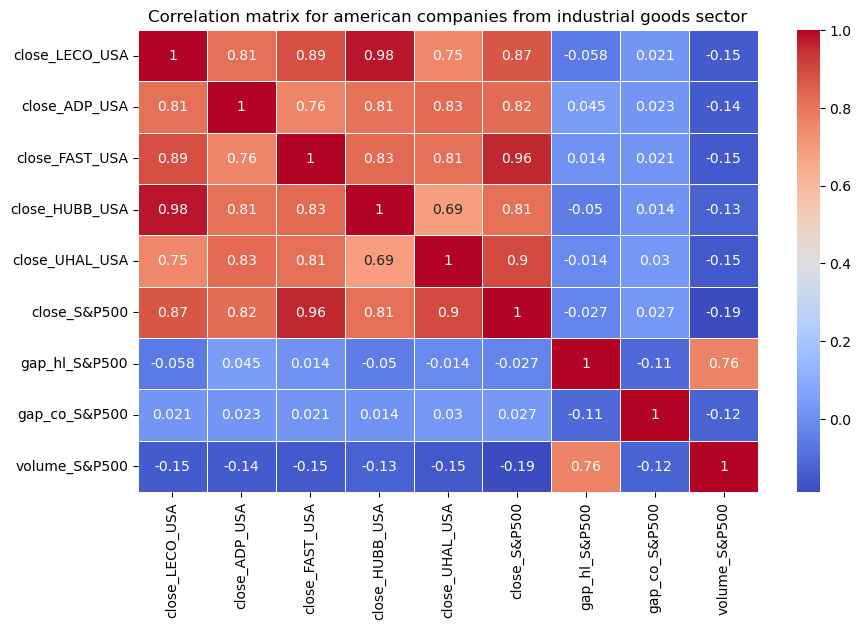

In [48]:
random.seed(25)
USA_price_samples_ig = random.sample(usa_ticker_names_close_ig, 5)
ig_corr = industrial_goods[USA_price_samples_ig + 
                       ['close_S&P500', 'gap_hl_S&P500', 'gap_co_S&P500', 'volume_S&P500']].corr()
plt.figure(figsize=(10, 6))
plt.title('Correlation matrix for american companies from industrial goods sector')
sns.heatmap(ig_corr, annot=True, cmap='coolwarm', linewidths=0.5);

For 5 randomly selected stocks of Russian companies.

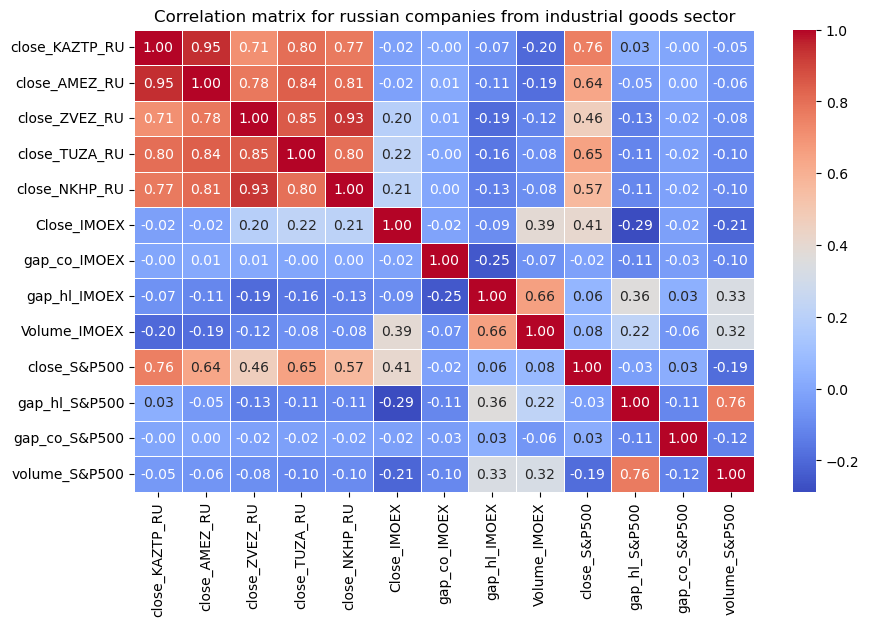

In [49]:
random.seed(52)
RU_price_samples_ig = random.sample(ru_ticker_names_close_ig, 5)
ig_corr = industrial_goods[RU_price_samples_ig + ['Close_IMOEX', 'gap_co_IMOEX', 
                                            'gap_hl_IMOEX', 'Volume_IMOEX', 'close_S&P500', 
                                            'gap_hl_S&P500', 'gap_co_S&P500', 'volume_S&P500']].corr()
plt.figure(figsize=(10, 6))
plt.title('Correlation matrix for russian companies from industrial goods sector')
sns.heatmap(ig_corr, annot=True, fmt='.2f', cmap='coolwarm', linewidths=0.5);

**Conclusion:** Once again, the importance and influence of the `close_S&P500` feature is confirmed. The correlation between stocks of different companies is also of interest.

## Renewable energy

For 5 randomly selected stocks of American companies.

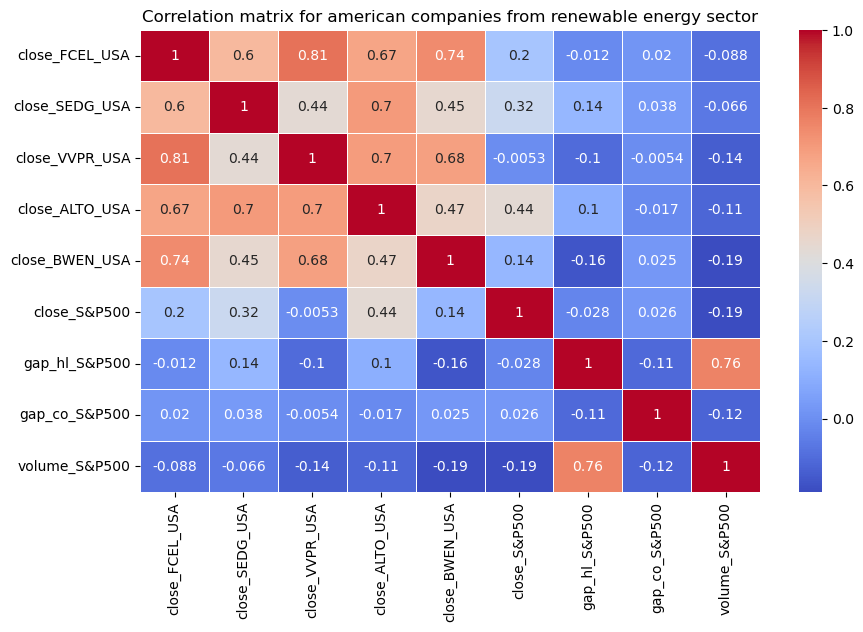

In [50]:
random.seed(25)
USA_price_samples_re = random.sample(usa_ticker_names_close_re, 5)
re_corr = renewable_energy[USA_price_samples_re + 
                       ['close_S&P500', 'gap_hl_S&P500', 'gap_co_S&P500', 'volume_S&P500']].corr()
plt.figure(figsize=(10, 6))
plt.title('Correlation matrix for american companies from renewable energy sector')
sns.heatmap(re_corr, annot=True, cmap='coolwarm', linewidths=0.5);

For 5 randomly selected stocks of Russian companies.

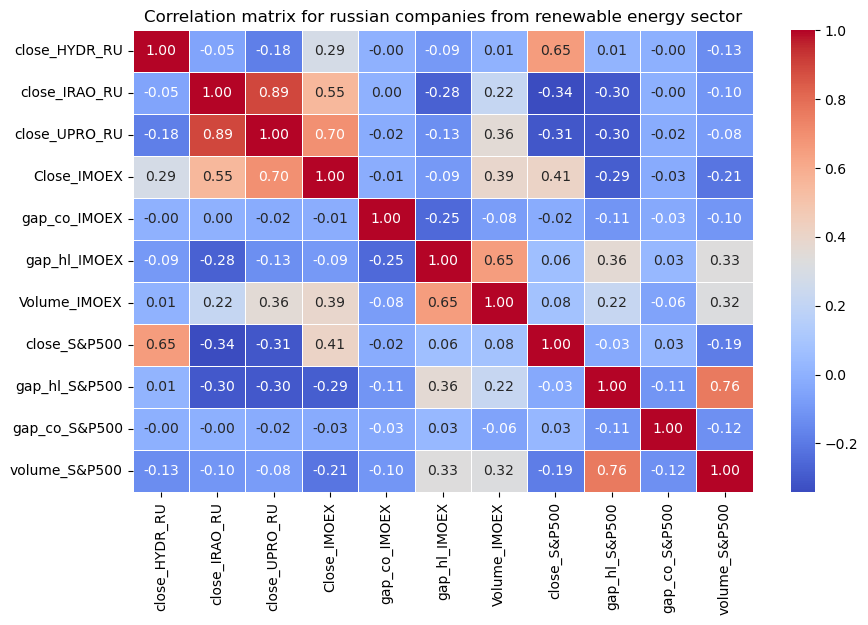

In [51]:
random.seed(52)
re_corr = renewable_energy[ru_ticker_names_close_re + ['Close_IMOEX', 'gap_co_IMOEX', 
                                            'gap_hl_IMOEX', 'Volume_IMOEX', 'close_S&P500', 
                                            'gap_hl_S&P500', 'gap_co_S&P500', 'volume_S&P500']].corr()
plt.figure(figsize=(10, 6))
plt.title('Correlation matrix for russian companies from renewable energy sector')
sns.heatmap(re_corr, annot=True, fmt='.2f', cmap='coolwarm', linewidths=0.5);

**Conclusion:** In the case of the **renewable energy sector**, it is difficult to pinpoint the undisputed importance of any specific feature. In some instances, there is a high correlation of stock prices with `Close_IMOEX`, in others with `close_S&P500`, and a slight correlation is also noticeable with `Volume_IMOEX`.

## Healthcare services

For 5 randomly selected stocks of American companies.

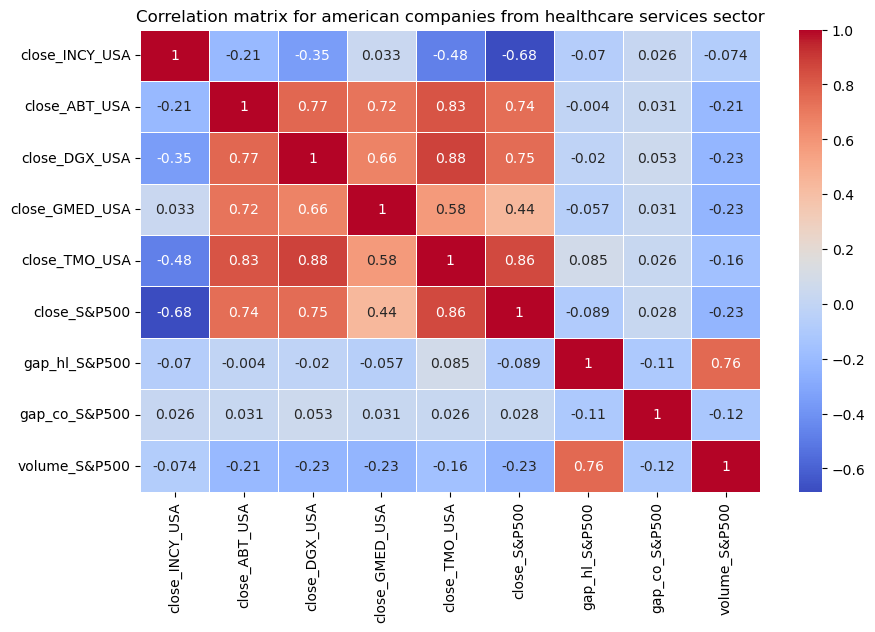

In [52]:
random.seed(25)
USA_price_samples_hs = random.sample(usa_ticker_names_close_hs, 5)
hs_corr = healthcare_services[USA_price_samples_hs + 
                       ['close_S&P500', 'gap_hl_S&P500', 'gap_co_S&P500', 'volume_S&P500']].corr()
plt.figure(figsize=(10, 6))
plt.title('Correlation matrix for american companies from healthcare services sector')
sns.heatmap(hs_corr, annot=True, cmap='coolwarm', linewidths=0.5);

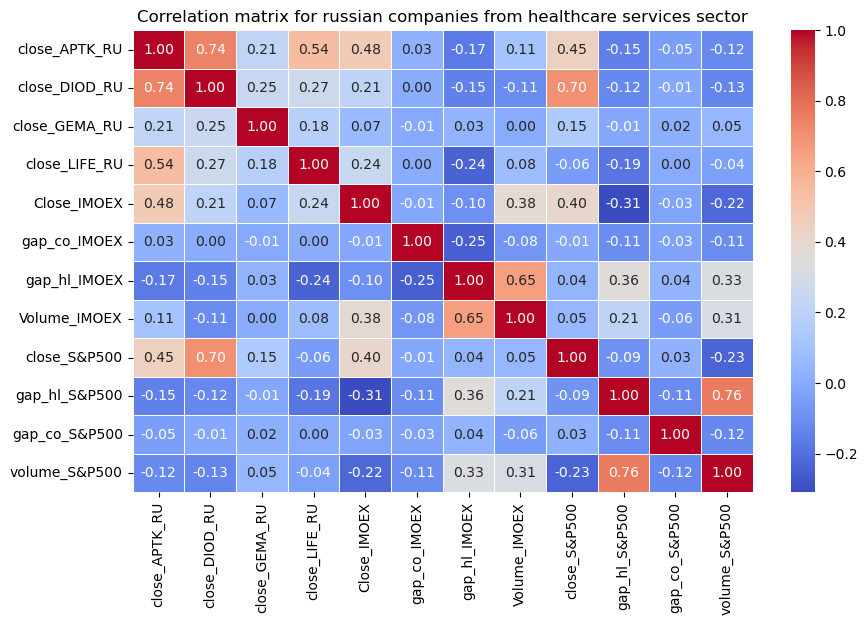

In [53]:
random.seed(52)
hs_corr = healthcare_services[ru_ticker_names_close_hs + ['Close_IMOEX', 'gap_co_IMOEX', 
                                            'gap_hl_IMOEX', 'Volume_IMOEX', 'close_S&P500', 
                                            'gap_hl_S&P500', 'gap_co_S&P500', 'volume_S&P500']].corr()
plt.figure(figsize=(10, 6))
plt.title('Correlation matrix for russian companies from healthcare services sector')
sns.heatmap(hs_corr, annot=True, fmt='.2f', cmap='coolwarm', linewidths=0.5);

**Conclusion:** In the case of American stocks, the importance and influence of the close_S&P500 feature is confirmed. The correlation between stocks of different companies is also noteworthy. Russian stocks do not always correlate with the `close_S&P500` feature. Sometimes, a correlation with `Close_IMOEX` is evident.

<a id='scatter_plots_usdrub_stocks'></a>
# **Step №4.** Scatter diagrams for USD/RUB and the stocks prices.

## Fintech

First, we'll get an overview using `PairGrid`. Then, we'll take a closer look at specific pairs using `scatterplot`.

In [54]:
usdrub_shares_fintech = ru_ticker_names_close_fintech + ['usdrub']

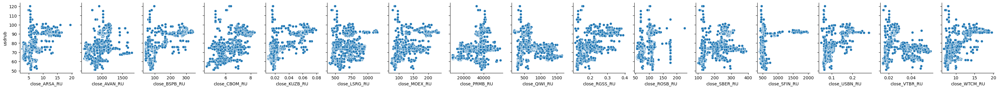

In [55]:
scatters = sns.PairGrid(fintech[usdrub_shares_fintech], y_vars=['usdrub'], x_vars=ru_ticker_names_close_fintech, height=3, aspect=0.7)
scatters.map(sns.scatterplot)

plt.show()

The only interesting regplots:

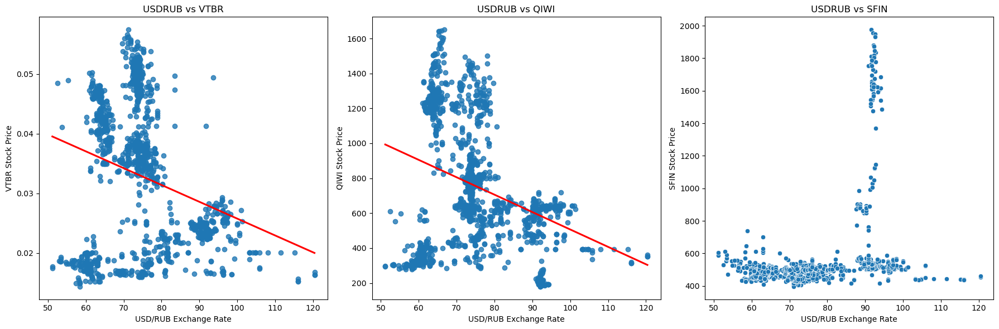

In [56]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

sns.regplot(x='usdrub', y='close_VTBR_RU', data=fintech, ax=axes[0], ci=None, line_kws={'color': 'red'})
axes[0].set_title('USDRUB vs VTBR')
axes[0].set_xlabel('USD/RUB Exchange Rate')
axes[0].set_ylabel('VTBR Stock Price')

sns.regplot(x='usdrub', y='close_QIWI_RU', data=fintech, ax=axes[1], ci=None, line_kws={'color': 'red'})
axes[1].set_title('USDRUB vs QIWI')
axes[1].set_xlabel('USD/RUB Exchange Rate')
axes[1].set_ylabel('QIWI Stock Price')

sns.scatterplot(x='usdrub', y='close_SFIN_RU', data=fintech, ax=axes[2])
axes[2].set_title('USDRUB vs SFIN')
axes[2].set_xlabel('USD/RUB Exchange Rate')
axes[2].set_ylabel('SFIN Stock Price')

plt.tight_layout()
plt.show()

In the case of the first two stocks, we observe a negative trend line slope, which appears to be an interesting observation. However, the scatter points are so **chaotically dispersed** that it prevents us from drawing any concrete conclusions. We decided to keep the third graph in order **to develop a new feature.** But if we look at the graph for the `SFIN_RU` company stocks, it's clear that there is nothing particularly noteworthy to extract from it.

## Industrial goods

As before, we'll get an overview using `PairGrid`. Then, we'll take a closer look at specific pairs using `scatterplot`.

In [57]:
usdrub_shares_ig = ru_ticker_names_close_ig + ['usdrub']

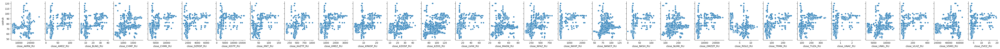

In [58]:
scatters = sns.PairGrid(industrial_goods[usdrub_shares_ig], y_vars=['usdrub'], x_vars=ru_ticker_names_close_ig, height=3, aspect=0.7)
scatters.map(sns.scatterplot)

plt.show()

The only interesting regplots:

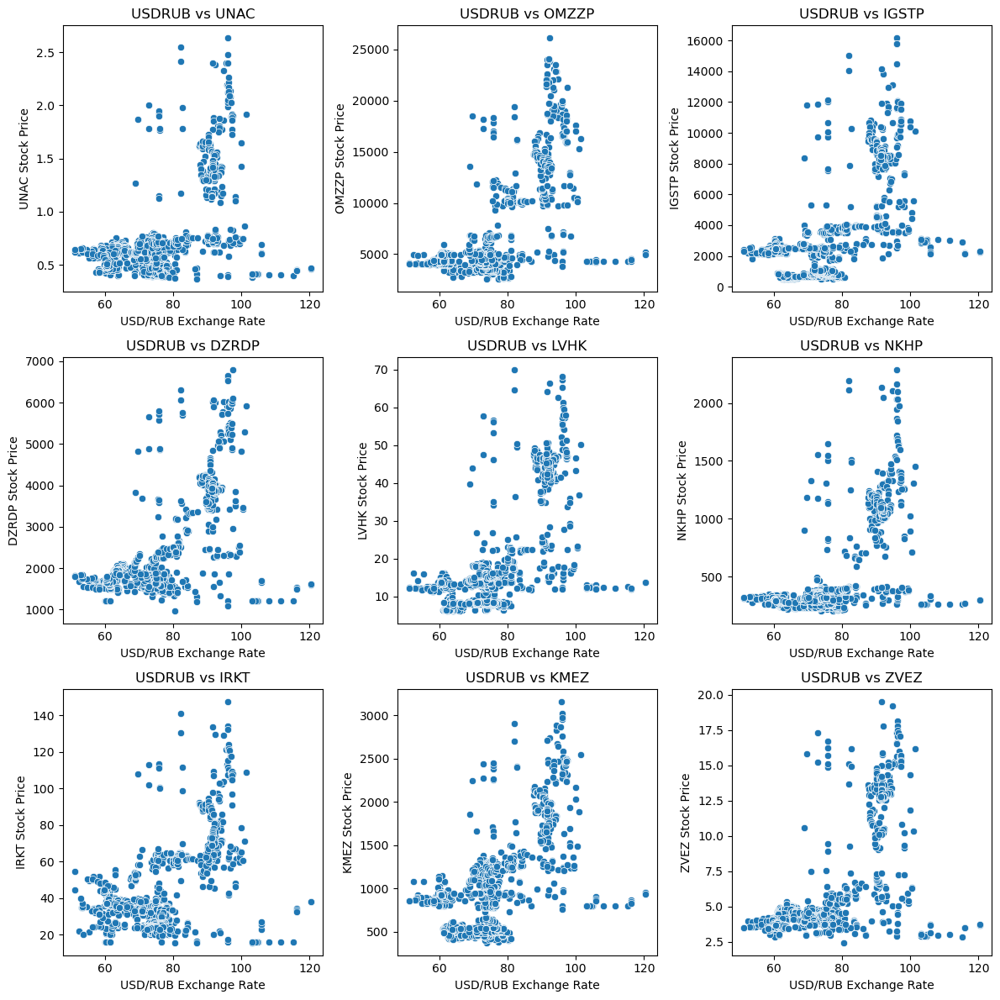

In [59]:
fig, axes = plt.subplots(3, 3, figsize=(12, 12))

sns.scatterplot(x='usdrub', y='close_UNAC_RU', data=industrial_goods, ax=axes[0, 0])
axes[0, 0].set_title('USDRUB vs UNAC')
axes[0, 0].set_xlabel('USD/RUB Exchange Rate')
axes[0, 0].set_ylabel('UNAC Stock Price')

sns.scatterplot(x='usdrub', y='close_OMZZP_RU', data=industrial_goods, ax=axes[0, 1])
axes[0, 1].set_title('USDRUB vs OMZZP')
axes[0, 1].set_xlabel('USD/RUB Exchange Rate')
axes[0, 1].set_ylabel('OMZZP Stock Price')

sns.scatterplot(x='usdrub', y='close_IGSTP_RU', data=industrial_goods, ax=axes[0, 2])
axes[0, 2].set_title('USDRUB vs IGSTP')
axes[0, 2].set_xlabel('USD/RUB Exchange Rate')
axes[0, 2].set_ylabel('IGSTP Stock Price')

sns.scatterplot(x='usdrub', y='close_DZRDP_RU', data=industrial_goods, ax=axes[1, 0])
axes[1, 0].set_title('USDRUB vs DZRDP')
axes[1, 0].set_xlabel('USD/RUB Exchange Rate')
axes[1, 0].set_ylabel('DZRDP Stock Price')

sns.scatterplot(x='usdrub', y='close_LVHK_RU', data=industrial_goods, ax=axes[1, 1])
axes[1, 1].set_title('USDRUB vs LVHK')
axes[1, 1].set_xlabel('USD/RUB Exchange Rate')
axes[1, 1].set_ylabel('LVHK Stock Price')

sns.scatterplot(x='usdrub', y='close_NKHP_RU', data=industrial_goods, ax=axes[1, 2])
axes[1, 2].set_title('USDRUB vs NKHP')
axes[1, 2].set_xlabel('USD/RUB Exchange Rate')
axes[1, 2].set_ylabel('NKHP Stock Price')

sns.scatterplot(x='usdrub', y='close_IRKT_RU', data=industrial_goods, ax=axes[2, 0])
axes[2, 0].set_title('USDRUB vs IRKT')
axes[2, 0].set_xlabel('USD/RUB Exchange Rate')
axes[2, 0].set_ylabel('IRKT Stock Price')

sns.scatterplot(x='usdrub', y='close_KMEZ_RU', data=industrial_goods, ax=axes[2, 1])
axes[2, 1].set_title('USDRUB vs KMEZ')
axes[2, 1].set_xlabel('USD/RUB Exchange Rate')
axes[2, 1].set_ylabel('KMEZ Stock Price')

sns.scatterplot(x='usdrub', y='close_ZVEZ_RU', data=industrial_goods, ax=axes[2, 2])
axes[2, 2].set_title('USDRUB vs ZVEZ')
axes[2, 2].set_xlabel('USD/RUB Exchange Rate')
axes[2, 2].set_ylabel('ZVEZ Stock Price')

plt.tight_layout()
plt.show()

For these stocks, we were interested in the price increase within **the exchange rate range from 90 to 100**. We'll keep this fact in mind for further investigation and model development.

## Renewable energy

As before, we'll get an overview using `PairGrid`.

In [60]:
usdrub_shares_re = ru_ticker_names_close_re + ['usdrub']

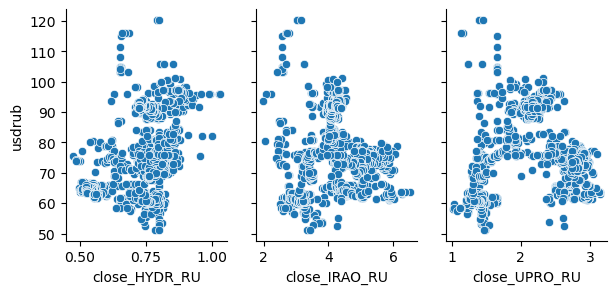

In [61]:
scatters = sns.PairGrid(renewable_energy[usdrub_shares_re], y_vars=['usdrub'], x_vars=ru_ticker_names_close_re, height=3, aspect=0.7)
scatters.map(sns.scatterplot)

plt.show()

No interesting observations.

## Healthcare services

Let's see the `PairGrid` in this sector.

In [62]:
usdrub_shares_hs = ru_ticker_names_close_hs + ['usdrub']

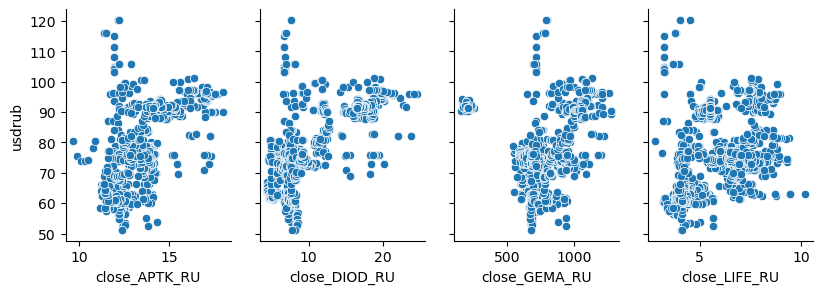

In [63]:
scatters = sns.PairGrid(healthcare_services[usdrub_shares_hs], y_vars=['usdrub'], x_vars=ru_ticker_names_close_hs, height=3, aspect=0.7)
scatters.map(sns.scatterplot)

plt.show()

Nothing Interesting. Except the fact about `clear clusters`, that will be mentioned below, as **general conclusion for all scatter plots!**

It's also important to understand **how strongly the `USD/RUB` exchange rate is linked to precious metal prices** (we've checked it below). Therefore, there is no point in producing scatter diagrams for precious metal prices and the stock prices of Russian companies. We will focus only on American companies.

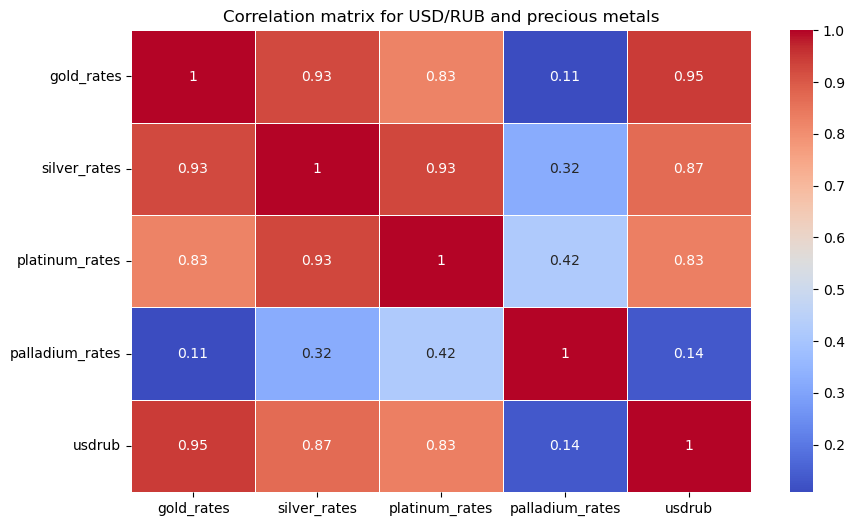

In [87]:
precious_usdrub_corr = fintech[['gold_rates', 'silver_rates', 'platinum_rates', 'palladium_rates', 'usdrub']].corr()
plt.figure(figsize=(10, 6))
plt.title('Correlation matrix for USD/RUB and precious metals')
sns.heatmap(precious_usdrub_corr, annot=True, cmap='coolwarm', linewidths=0.5);

As it turns out, `Palladium` particularly **does not correlate** with the `USD/RUB` exchange rate and **the prices of other precious metals**. This is interesting, and we'll keep it in mind.

<a id='metal_prices_stocks'></a>
#  **Step №5.** Analysis of dependencies between precious metal prices and stock prices

Let's move on to the next group of features: prices of precious metals. We will explore them through scatter diagrams.

**Disclaimer:** here we will have one **general conclusion** in the end of the step.

## Fintech

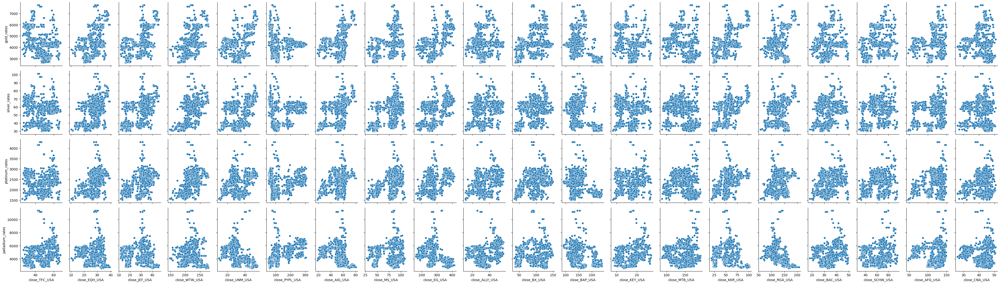

In [65]:
random.seed(5)
random_usa_ticker_names_fintech = random.sample(usa_ticker_names_close_fintech, 20)
precious_metals_fintech_shares = random_usa_ticker_names_fintech + ['gold_rates', 'silver_rates', 'platinum_rates', 'palladium_rates']
scatters = sns.PairGrid(fintech[precious_metals_fintech_shares], y_vars=['gold_rates', 'silver_rates', 'platinum_rates', 'palladium_rates'], x_vars=random_usa_ticker_names_fintech, height=3, aspect=0.7)
scatters.map(sns.scatterplot)

plt.show()

## Industrial goods

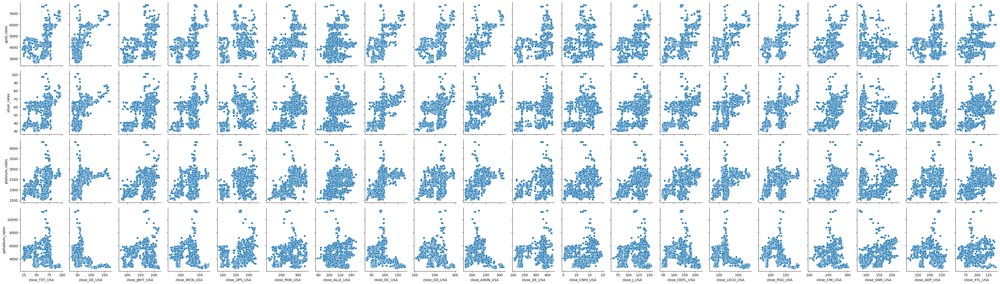

In [66]:
random.seed(5)
random_usa_ticker_names_ig = random.sample(usa_ticker_names_close_ig, 20)
precious_metals_shares_ig = random_usa_ticker_names_ig + ['gold_rates', 'silver_rates', 'platinum_rates', 'palladium_rates']
scatters = sns.PairGrid(industrial_goods[precious_metals_shares_ig], y_vars=['gold_rates', 'silver_rates', 'platinum_rates', 'palladium_rates'], x_vars=random_usa_ticker_names_ig, height=3, aspect=0.7)
scatters.map(sns.scatterplot)

plt.show()

## Renewable energy

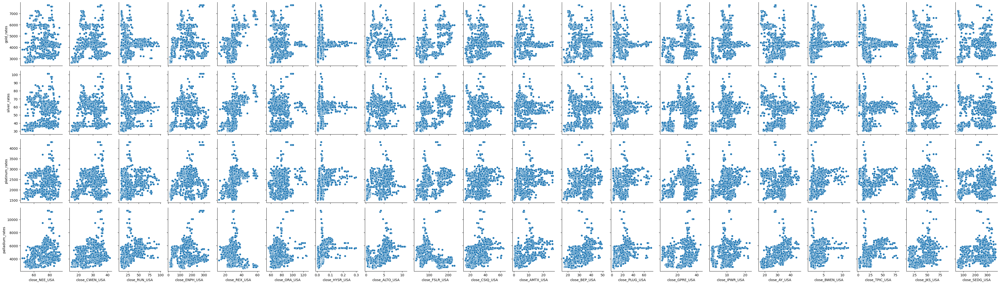

In [67]:
random.seed(5)
random_usa_ticker_names_re = random.sample(usa_ticker_names_close_re, 20)
precious_metals_re_shares = random_usa_ticker_names_re + ['gold_rates', 'silver_rates', 'platinum_rates', 'palladium_rates']
scatters = sns.PairGrid(renewable_energy[precious_metals_re_shares], y_vars=['gold_rates', 'silver_rates', 'platinum_rates', 'palladium_rates'], x_vars=random_usa_ticker_names_re, height=3, aspect=0.7)
scatters.map(sns.scatterplot)

plt.show()

## Healthcare services

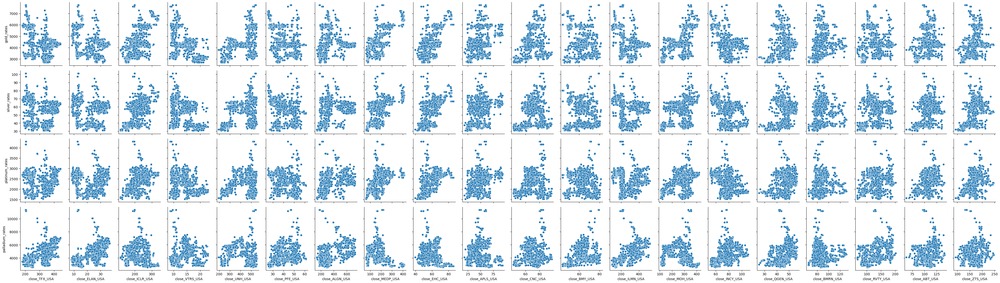

In [68]:
random.seed(5)
random_usa_ticker_names_hs = random.sample(usa_ticker_names_close_hs, 20)
precious_metals_hs_shares = random_usa_ticker_names_hs + ['gold_rates', 'silver_rates', 'platinum_rates', 'palladium_rates']
scatters = sns.PairGrid(healthcare_services[precious_metals_hs_shares], y_vars=['gold_rates', 'silver_rates', 'platinum_rates', 'palladium_rates'], x_vars=random_usa_ticker_names_hs, height=3, aspect=0.7)
scatters.map(sns.scatterplot)

plt.show()

**General conclusion:** Hypothetically, these whimsical figures and clear clusters on some graphs suggest that the market was in several "modes" of trading or economic states.

<a id='hypothesis1'></a>
# **Hypothesis №1**: distribution of returns

*Let's test if the hypothesis of normality for the returns of our stocks in each sector holds true?*

**The reason we check it:** We hope to find out, that **returns** or at least **log-returns** have **normal distribution**, because in this way we could choose more accurate method, taking this into account.

First, we tried to use the standard significance level at **0.01**

Then, to make sure, that we can reject the null hypothesis, we decided to set **0.5** - the result remained the same

* $H_0:$ $R_x \sim \mathcal{N}(\mu_x, \sigma_x)$
* $H_1:$ $R_x \not\sim \mathcal{N}(\mu_x, \sigma_x)$

where $R_x$ - stock return; $\mu_x$ - stock expected value; $\sigma_x$ - stock standard deviation

In [69]:
level_of_significance = 0.01

For visualization, let's display a histogram of the log returns for `ACGL` from the fintech sector.

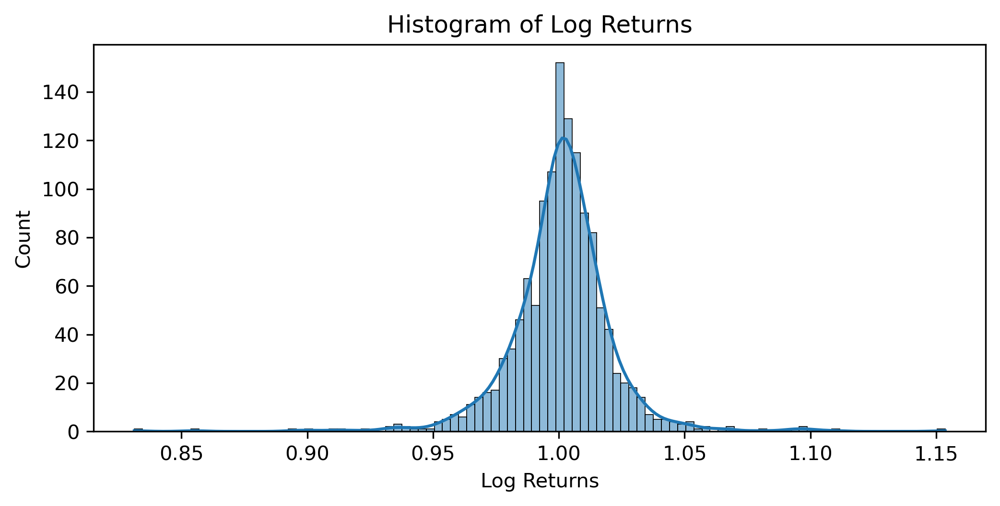

In [70]:
log_returns = (fintech['close_ACGL_USA']/fintech['close_ACGL_USA'].shift(1))
plt.figure(figsize=(8,3.5), dpi=300)
sns.histplot(log_returns, bins=100, kde=True)

plt.title('Histogram of Log Returns')
plt.xlabel('Log Returns')
plt.show()

Let's get rid of statistical outliers:

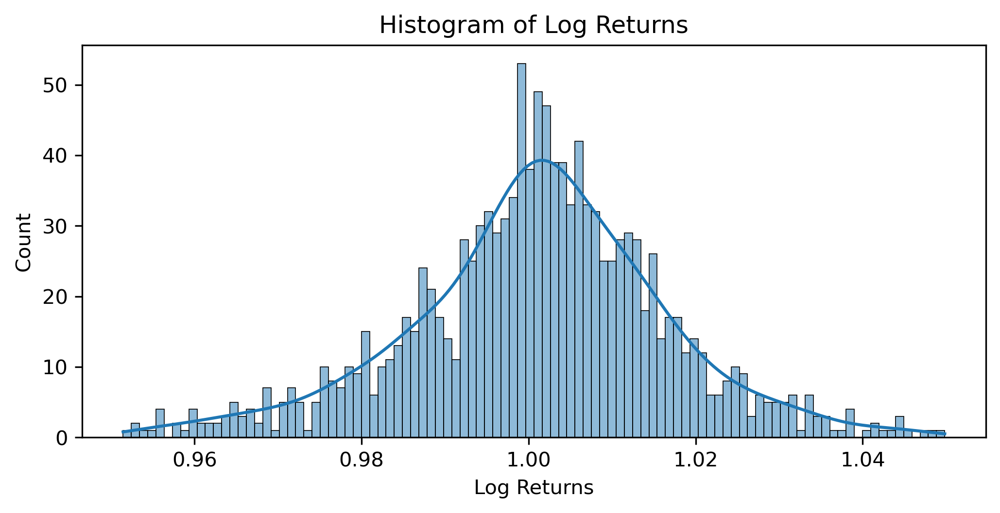

In [71]:
plt.figure(figsize=(8,3.5), dpi=300)
sns.histplot(log_returns.loc[(log_returns > 0.95) & (log_returns < 1.05)], bins=100, kde=True)

plt.title('Histogram of Log Returns')
plt.xlabel('Log Returns')
plt.show()

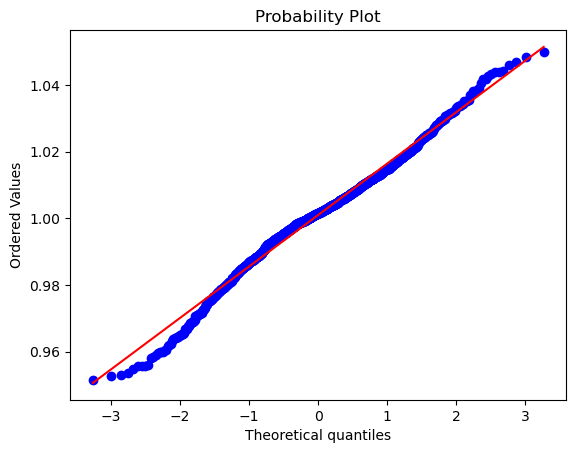

In [72]:
stats.probplot(log_returns.loc[(log_returns > 0.95) & (log_returns < 1.05)], dist="norm", plot=plt);

We decided to test for normality using **the Shapiro-Wilk test**, which is most effective for this case. We've applied a very stringent restriction (`significance level = 0.01`) to reject the null hypothesis.

!!! The null hypothesis is rejected if `p-value <= significance level`. This means we will only report the count and tickers of those stocks whose returns are normally distributed.

In [73]:
def norm_distribution_amount(dataset):
    dataset.set_index('date', inplace=True)
    ru_ticker_names_close_dataset = [ticker for ticker in dataset.columns if (ticker[-2:] == 'RU') 
                                     and (ticker[:5] == 'close')]
    usa_ticker_names_close_dataset = [ticker for ticker in dataset.columns if (ticker[-3:] == 'USA') 
                                      and (ticker[:5] == 'close')]
    dataset_close_without_date = ru_ticker_names_close_dataset + usa_ticker_names_close_dataset
    
    count = 0
    for col in dataset[dataset_close_without_date]:
        log_returns = np.log(dataset[col]/dataset[col].shift(1))
        log_returns.dropna(inplace=True)
        shapiro_test = stats.shapiro(log_returns)
        if shapiro_test.pvalue > level_of_significance:
            print(col)
            count += 1
        
    return count

In [74]:
print(f'The null hypothesis isn`t reject for {norm_distribution_amount(fintech)} shares.')
print(f'The null hypothesis isn`t reject for {norm_distribution_amount(industrial_goods)} shares.')
print(f'The null hypothesis isn`t reject for {norm_distribution_amount(healthcare_services)} shares.')
print(f'The null hypothesis isn`t reject for {norm_distribution_amount(renewable_energy)} shares.')

The null hypothesis isn`t reject for 0 shares.
close_NKSH_RU
The null hypothesis isn`t reject for 1 shares.
The null hypothesis isn`t reject for 0 shares.
The null hypothesis isn`t reject for 0 shares.


**Conclusion:** the only stock, for which null hypothesis isn't reject is `NKSH_RU`. **It's not enough to use this result during creating ML-models.**

<a id='hypothesis2'></a>
# **Hypothesis №2**: stylized fact about January

*Let's test if in **January**, the expected return **is the same** as in other monthes.* 

**The reason we check it:** We hope to find out, that in January the expected returns are higher, because in this way we will be able to create more accurate ML-model (for example, using new categorical feature `january or not`). **Returns can be higher**, because in December some investors want to sell thier shares and **pay less taxes**, but then, in January, they start to buy them and the price goes up. Also some funds can buy more shares after **getting results from the passed year** and analysing them. And some investors get **bonuses and kind of bounties**, that they can also invest in the asset.

* $H_0: \mu_{jan} = \mu_{other\ monthes}$ 
* $H_1: \mu_{jan} \not= \mu_{other\ monthes}$ 

In [75]:
for col in fintech[fintech_exp_smoothing]:
    fintech_log_returns = np.log(fintech[col]/fintech[col].shift(1))
    fintech_log_returns.dropna(inplace=True)

In [76]:
count_fintech_norm = 0
for col in fintech[fintech_exp_smoothing]:
    fintech_log_returns = np.log(fintech[col]/fintech[col].shift(1))
    fintech_log_returns.dropna(inplace=True)
    shapiro_test = stats.shapiro(fintech_log_returns)
    if shapiro_test.pvalue > level_of_significance:
        print(col)
        count_fintech_norm += 1
        
count_fintech_norm

0

In [77]:
def check_hypothesis_about_January(dataset):
    
    ru_ticker_names_close_dataset = [ticker for ticker in dataset.columns if (ticker[-2:] == 'RU') 
                                     and (ticker[:5] == 'close')]
    usa_ticker_names_close_dataset = [ticker for ticker in dataset.columns if (ticker[-3:] == 'USA') 
                                      and (ticker[:5] == 'close')]
    dataset_close_without_date = ru_ticker_names_close_dataset + usa_ticker_names_close_dataset
    dataset_close_with_date = ru_ticker_names_close_dataset + usa_ticker_names_close_dataset + ['date']
    
    new_df_for_dataset = (dataset[dataset_close_without_date]/dataset[dataset_close_without_date].shift(1))
    new_df_for_dataset.dropna(inplace=True)
    
    if new_df_for_dataset.index.name == 'date':  
        new_df_for_dataset.reset_index(inplace=True)
    else: 
        new_df_for_dataset.reset_index(inplace=True, drop=True)
    
    monthly_mean_return = new_df_for_dataset.groupby(new_df_for_dataset['date'].dt.month).mean()
    
    january_with_best_return = 0
    for col in dataset_close_without_date:
        if monthly_mean_return[col].max() == monthly_mean_return.loc[1, col]:
            january_with_best_return += 1
        
    return round(january_with_best_return / len(dataset_close_without_date), 2)

In [78]:
print(f'In fintech sector expected returns were the highest in January for {round(check_hypothesis_about_January(fintech)*100)}% of stocks under the study.')
print(f'In industrial goods sector expected returns were the highest in January for {round(check_hypothesis_about_January(industrial_goods)*100)}% of stocks under the study.')
print(f'In healthcare services sector expected returns were the highest in January for {round(check_hypothesis_about_January(healthcare_services)*100)}% of stocks under the study.')
print(f'In renewable energy sector expected returns were the highest in January for {round(check_hypothesis_about_January(renewable_energy)*100)}% of stocks under the study.')

In fintech sector expected returns were the highest in January for 4% of stocks under the study.
In industrial goods sector expected returns were the highest in January for 3% of stocks under the study.
In healthcare services sector expected returns were the highest in January for 3% of stocks under the study.
In renewable energy sector expected returns were the highest in January for 10% of stocks under the study.


To satisfy academic precision we can check null hypothesis, using **Wilcoxon test**.

Unfortunately, we can't use **t-test** due to the rejection of the [Hypothesis №1](#hypothesis1).

In [79]:
def wilcoxon_test_for_2_hypothesis(dataset):
    
    ru_ticker_names_close_dataset = [ticker for ticker in dataset.columns if (ticker[-2:] == 'RU') 
                                     and (ticker[:5] == 'close')]
    usa_ticker_names_close_dataset = [ticker for ticker in dataset.columns if (ticker[-3:] == 'USA') 
                                      and (ticker[:5] == 'close')]
    dataset_close_without_date = ru_ticker_names_close_dataset + usa_ticker_names_close_dataset
    dataset_close_with_date = ru_ticker_names_close_dataset + usa_ticker_names_close_dataset + ['date']
    
    new_df_for_dataset = (dataset[dataset_close_without_date]/dataset[dataset_close_without_date].shift(1))
    new_df_for_dataset.dropna(inplace=True)
    
    if new_df_for_dataset.index.name == 'date':  
        new_df_for_dataset.reset_index(inplace=True)
    else: 
        new_df_for_dataset.reset_index(inplace=True, drop=True)
    
    monthly_mean_return = new_df_for_dataset.groupby(new_df_for_dataset['date'].dt.month).mean()
    
    rejection_counter = 0
    for col in dataset_close_without_date:
        stat, p_value = stats.wilcoxon(monthly_mean_return[col], alternative='two-sided')

        if p_value < level_of_significance:
            rejection_counter += 1
        else:
            print(f'The null hypothesis can`t be rejected for {col}')
    return f'We can reject the null hypothesis for {rejection_counter} shares'

In [80]:
print(f'{wilcoxon_test_for_2_hypothesis(fintech)} in fintech sector!')
print()
print(f'{wilcoxon_test_for_2_hypothesis(industrial_goods)} in industrial goods sector!')
print()
print(f'{wilcoxon_test_for_2_hypothesis(healthcare_services)} in healthcare services sector!')
print()
print(f'{wilcoxon_test_for_2_hypothesis(renewable_energy)} in renewable energy sector!')

We can reject the null hypothesis for 105 shares in fintech sector!

The null hypothesis can`t be rejected for close_NKSH_RU
We can reject the null hypothesis for 122 shares in industrial goods sector!

We can reject the null hypothesis for 98 shares in healthcare services sector!

We can reject the null hypothesis for 30 shares in renewable energy sector!


**Conclusion:** and again... Only one company share satisfy that condition, that we have set in the null hypothesis. **It's not enough to use this result during creating ML-models.**

Following plots **are not** the result of our mistake. We just **wanted to show you, that there is almost no difference!**

In [81]:
def plot_monthly_mean_returns(dataset, ax):
    ru_ticker_names_close_dataset = [ticker for ticker in dataset.columns if (ticker[-2:] == 'RU') 
                                     and (ticker[:5] == 'close')]
    usa_ticker_names_close_dataset = [ticker for ticker in dataset.columns if (ticker[-3:] == 'USA') 
                                      and (ticker[:5] == 'close')]
    dataset_close_without_date = ru_ticker_names_close_dataset + usa_ticker_names_close_dataset
    
    new_df_for_dataset = (dataset[dataset_close_without_date] / dataset[dataset_close_without_date].shift(1))
    new_df_for_dataset.dropna(inplace=True)
    
    new_df_for_dataset['date'] = dataset.index[1:]
    
    monthly_mean_return = new_df_for_dataset.groupby(new_df_for_dataset['date'].dt.month).mean()
    
    overall_monthly_mean_return = monthly_mean_return.mean(axis=1).reset_index()
    overall_monthly_mean_return.columns = ['Month', 'Average_Return']
    
    sns.barplot(x='Month', y='Average_Return', data=overall_monthly_mean_return, palette='viridis', ax=ax)
    ax.set_title('Average Monthly Returns')
    ax.set_xlabel('Month')
    ax.set_ylabel('Average Return')
    ax.set_xticks(range(12))
    ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], rotation=30)
    

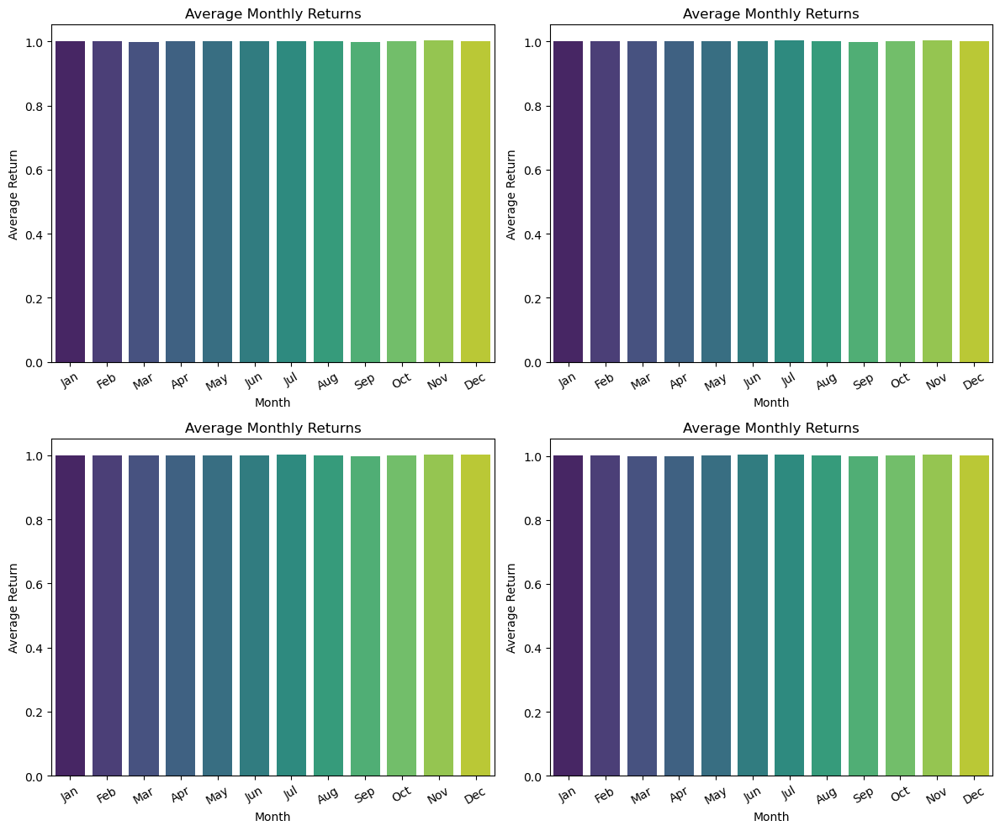

In [82]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

plot_monthly_mean_returns(fintech, axes[0, 0])
plot_monthly_mean_returns(industrial_goods, axes[0, 1])
plot_monthly_mean_returns(healthcare_services, axes[1, 0])
plot_monthly_mean_returns(renewable_energy, axes[1, 1])

plt.tight_layout()
plt.show()

<a id='hypothesis3'></a>
# **Hypothesis №3**: stylized facts about the days of the week

*Let's test the following stylized fact: "On the American market, the expected return is highest on Monday and lowest on Wednesday. On the Russian market, it is the opposite."*

**The reason we check it:** this also one of the default [`Calendar effect`](http://www.cs.ucl.ac.uk/fileadmin/UCL-CS/images/Research_Student_Information/RN_11_01.pdf) that can be found in many articles. We decided that it's necessary to check, because if this fact is confirmed, we are able to create new feature and get better result in forecasting.

* $H_0: \mu_{mon\ in\ usa\ or\ rus} = \mu_{other\ days}$ 
* $H_1: \mu_{mon\ in\ usa\ or\ rus} \not= \mu_{other\ days}$ 

In [83]:
def check_hypothesis_about_days_of_week_russia(dataset):
    ru_ticker_names_close_dataset = [ticker for ticker in dataset.columns if (ticker[-2:] == 'RU') 
                                     and (ticker[:5] == 'close')]
    dataset_close_without_date = ru_ticker_names_close_dataset
    dataset_close_with_date = ru_ticker_names_close_dataset + ['date']
    
    new_df_for_dataset = (dataset[dataset_close_without_date]/dataset[dataset_close_without_date].shift(1))
    new_df_for_dataset.dropna(inplace=True)
    
    if new_df_for_dataset.index.name == 'date':  
        new_df_for_dataset.reset_index(inplace=True)
    else: 
        new_df_for_dataset.reset_index(inplace=True, drop=True)
    
    dairy_mean_return = new_df_for_dataset.groupby(new_df_for_dataset['date'].dt.weekday).mean()
    
    monday_is_worst_in_ru = 0
    wednesday_is_best_in_ru = 0
    for col in dataset_close_without_date:
        if dairy_mean_return[col].min() == dairy_mean_return.loc[0, col]:
            monday_is_worst_in_ru += 1
        if dairy_mean_return[col].max() == dairy_mean_return.loc[2, col]:
            wednesday_is_best_in_ru += 1
        
    return f'Monday is the least profitable day in {round(monday_is_worst_in_ru / len(dataset_close_without_date) * 100)}% of company shares, while wednesday is the most - in {round(wednesday_is_best_in_ru / len(dataset_close_without_date) * 100)}%'

In [84]:
print(f'Fintech: {check_hypothesis_about_days_of_week_russia(fintech)}.')
print()
print(f'Industrial goods: {check_hypothesis_about_days_of_week_russia(industrial_goods)}.')
print()
print(f'Healthcare services: {check_hypothesis_about_days_of_week_russia(healthcare_services)}.')
print()
print(f'Renewable energy: {check_hypothesis_about_days_of_week_russia(renewable_energy)}.')

Fintech: Monday is the least profitable day in 6% of company shares, while wednesday is the most - in 19%.

Industrial goods: Monday is the least profitable day in 0% of company shares, while wednesday is the most - in 24%.

Healthcare services: Monday is the least profitable day in 0% of company shares, while wednesday is the most - in 0%.

Renewable energy: Monday is the least profitable day in 0% of company shares, while wednesday is the most - in 0%.


In [85]:
def check_hypothesis_about_days_of_week_usa(dataset):
    
    usa_ticker_names_close_dataset = [ticker for ticker in dataset.columns if (ticker[-3:] == 'USA') 
                                      and (ticker[:5] == 'close')]
    dataset_close_without_date =  usa_ticker_names_close_dataset
    dataset_close_with_date = usa_ticker_names_close_dataset + ['date']
    
    new_df_for_dataset = (dataset[dataset_close_without_date]/dataset[dataset_close_without_date].shift(1))
    new_df_for_dataset.dropna(inplace=True)
    
    if new_df_for_dataset.index.name == 'date':  
        new_df_for_dataset.reset_index(inplace=True)
    else: 
        new_df_for_dataset.reset_index(inplace=True, drop=True)
    
    dairy_mean_return = new_df_for_dataset.groupby(new_df_for_dataset['date'].dt.weekday).mean()
    
    monday_is_best_in_usa = 0
    wednesday_is_worst_in_usa = 0
    for col in dataset_close_without_date:
        if dairy_mean_return[col].max() == dairy_mean_return.loc[0, col]:
            monday_is_best_in_usa += 1
        if dairy_mean_return[col].min() == dairy_mean_return.loc[2, col]:
            wednesday_is_worst_in_usa += 1
        
    return f'Monday is the most profitable day in {round(monday_is_best_in_usa / len(dataset_close_without_date) * 100)}% of company shares, while wednesday is the least - in {round(wednesday_is_worst_in_usa / len(dataset_close_without_date) * 100)}%'

In [86]:
print(f'Fintech:')
print(f'{check_hypothesis_about_days_of_week_usa(fintech)}.')
print()
print(f'Industrial goods:')
print(f'{check_hypothesis_about_days_of_week_usa(industrial_goods)}.')
print()
print(f'Healthcare services:')
print(f'{check_hypothesis_about_days_of_week_usa(healthcare_services)}.')
print()
print(f'Renewable energy:')
print(f'{check_hypothesis_about_days_of_week_usa(renewable_energy)}.')
      

Fintech:
Monday is the most profitable day in 12% of company shares, while wednesday is the least - in 36%.

Industrial goods:
Monday is the most profitable day in 17% of company shares, while wednesday is the least - in 43%.

Healthcare services:
Monday is the most profitable day in 12% of company shares, while wednesday is the least - in 13%.

Renewable energy:
Monday is the most profitable day in 11% of company shares, while wednesday is the least - in 30%.


**Conclusion:** as we can understand from the probability theory, if the proportion is about 15% (1/7), it's not interesting. Comparing to this value we can emphasize cases, where stylized fact under study is seems to be true.

So, talking about russian market - there is nothing to underline, but almost all sectors (except healthcare services) in american market comfirm stylized fact about wednesday! But still, unfortunately, obtained values are not so high (all beneath 50%).